In [1]:
name_subj = "S13"

import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

%matplotlib notebook

# Reading raw BDF, setting up bipolar references and montage

In [2]:
raw = mne.io.read_raw_bdf('../../raw_data/%s.bdf'%name_subj,preload=True, verbose=True)

Extracting EDF parameters from /home/gweindel/ownCloud/PhD/Projets/ForceEEG/raw_data/S13.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 4797439  =      0.000 ...  4684.999 secs...


In [3]:
mne.set_bipolar_reference(raw,anode=['EXG1','EXG3','EXG5','EXG7'],cathode=['EXG2','EXG4','EXG6','Fp2'],ch_name=['EMG_L','EMG_R','EOGH','EOGV'],copy=False, drop_refs=False) #fixe les références bipolaires pour les électrodes externes
raw.set_channel_types({'EMG_L':'emg','EMG_R':'emg','EOGH':'eog','EOGV':'eog','EXG8':'misc','Erg1':'misc','Erg2':'misc'}) #Détermine les types de canaux 
raw.set_eeg_reference(['EXG8']) #référence eeg  mastoide gauche
raw.drop_channels(['EXG1','EXG3','EXG5','EXG7','EXG2','EXG4','EXG6'])

Bipolar channel added as "EMG_L".
Bipolar channel added as "EMG_R".
Bipolar channel added as "EOGH".
Bipolar channel added as "EOGV".
EEG channel type selected for re-referencing
Applying a custom EEG reference.


<RawEDF | S13.bdf, 72 x 4797440 (4685.0 s), ~2.57 GB, data loaded>

## Montage

Here I recover the measurment made using ElGuide, however I only use one file (.sfp) from the three generated by subject, but it seems to be OK. (BORIS ?)

In [4]:
EEGhead_pos = pd.read_csv('../../raw_data/data_ForceEEG_Montage/%s_Force_EEG.sfp'%name_subj,skiprows=3, sep="\t", index_col=0,header=None,usecols=[0,3,5,7])/1000 #mm scale
ref_pos = pd.read_csv('../../raw_data/data_ForceEEG_Montage/%s_Force_EEG.sfp'%name_subj,skiprows=0, sep="\t", index_col=0,header=None,usecols=[0,3,6,9],nrows=3)/1000 #mm scale

EEGhead_pos = EEGhead_pos[(np.abs(EEGhead_pos[3]) < (np.std(EEGhead_pos[3])*8))]#removes weird postiion samples larger than 8sd

EEGkeys = EEGhead_pos[:64].index
EEGvalues = np.asarray(EEGhead_pos[:64].reset_index(drop=True))
EEG_points = dict(zip(EEGkeys, EEGvalues))

left, nasion, right = ref_pos.loc["fidt9"].values,ref_pos.loc["fidnz"].values,ref_pos.loc["fidt10"].values #Check LR correctness
head_points = np.asarray(EEGhead_pos[64:].reset_index(drop=True))

dig_montage = mne.channels.make_dig_montage(ch_pos=EEG_points, nasion=nasion, lpa=left, rpa=right, 
                                            hsp=head_points, hpi=None, coord_frame='head')

### Plotting sensor locations

Creating RawArray with float64 data, n_channels=64, n_times=1
    Range : 0 ... 0 =      0.000 ...     0.000 secs
Ready.


<IPython.core.display.Javascript object>


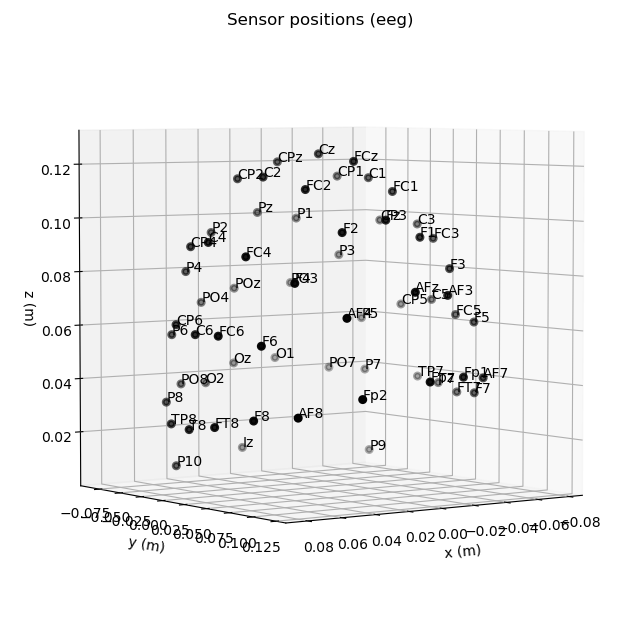

In [5]:
dig_montage.plot(kind='3d');


<IPython.core.display.Javascript object>


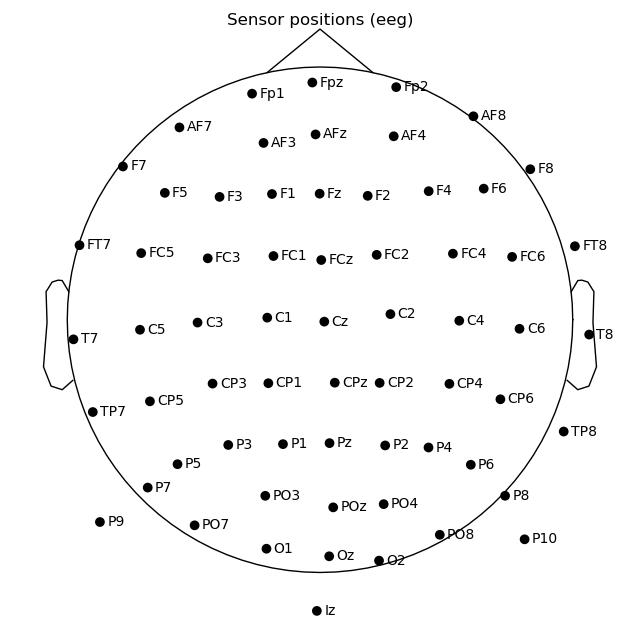

In [6]:
raw.set_montage(dig_montage)
raw.plot_sensors(show_names=True);

# Low-pass filtering

In [7]:
raw.filter(None, 100, None,l_trans_bandwidth='auto',filter_length='auto',phase='zero') #filtre les données entre 0.01 et 100 Hz


Filtering raw data in 1 contiguous segment
Setting up low-pass filter at 1e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal lowpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Upper passband edge: 100.00 Hz
- Upper transition bandwidth: 25.00 Hz (-6 dB cutoff frequency: 112.50 Hz)
- Filter length: 135 samples (0.132 sec)



<RawEDF | S13.bdf, 72 x 4797440 (4685.0 s), ~2.57 GB, data loaded>

## Checking for bad electrodes before applying average referencing

Here I take a first quick look at the data to detect really faulty or flat electrodes, plot not displayed in the notebook I send you because it is not very useful

<IPython.core.display.Javascript object>


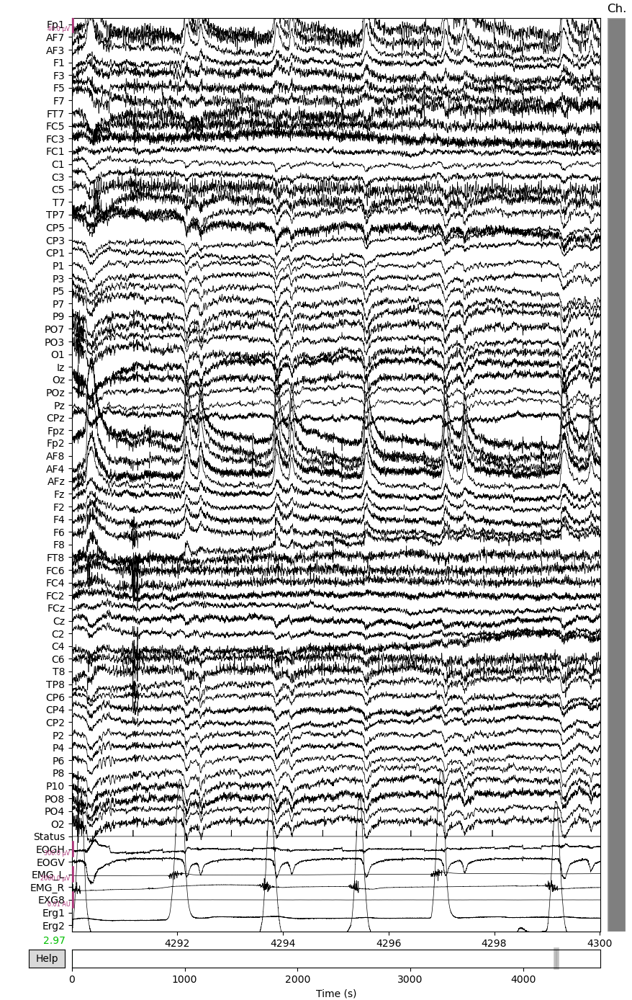

In [8]:
raw.plot();

Notes : 
- Participant with fast and slow blinks

In [9]:
raw.info['bads']

[]

I save the data, hence saving the montage, the low-pass filtered data, the annotation of the bad channel

Additionally I re-reference to average as EXG8 is particularly noisy making artifact detection difficult. Plus, simulation studies show that ICA is best achieved using average reference rather than _linked_ mastoids [référence](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC6798171/). BTW marking channels as bad before referencing to the average is sufficient to exclude them from the computation of the average

In [10]:
raw.set_eeg_reference('average')

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom EEG reference.


<RawEDF | S13.bdf, 72 x 4797440 (4685.0 s), ~2.57 GB, data loaded>

In [12]:
raw.save("%s/pre_rejection_%s.fif"%(name_subj,name_subj),overwrite=True) #sauvegarde les données au format fif pour la suite des traitements

Writing /home/gweindel/ownCloud/PhD/Projets/ForceEEG/processing_EEG/preprocessing/S13/pre_rejection_S13.fif


<ipython-input-12-e39f8df35fab>:1: RuntimeWarning: This filename (/home/gweindel/ownCloud/PhD/Projets/ForceEEG/processing_EEG/preprocessing/S13/pre_rejection_S13.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz or _meg.fif
  raw.save("%s/pre_rejection_%s.fif"%(name_subj,name_subj),overwrite=True) #sauvegarde les données au format fif pour la suite des traitements


Closing /home/gweindel/ownCloud/PhD/Projets/ForceEEG/processing_EEG/preprocessing/S13/pre_rejection_S13.fif [done]


# Rejecting artefacts

## For the remaining sections and up to the ICA reconstruction I only work with 1Hz High pass filtered data 

The reason being that annotation marked as bad, if not previously filtered to remove slow drifts, gives crazy ICA results (probably because it then captures a lot of edge artifacts from the drifts occuring between the breaks), plus lightly filtered data and average reference seems to ease the detection of artifact, both visually and with the ICA. But the final data (after reconstruction) will remain filtered at 0.01Hz as we usually do and as is recommended for ERP analysis

In [ ]:
raw = mne.io.read_raw_fif("%s/pre_rejection_%s.fif"%(name_subj,name_subj), preload=False)

In [11]:
filt_raw = raw.copy().load_data().filter(l_freq=1., h_freq=None) # I filter to ease processing (and problem with BAD_breaks)

Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 3379 samples (3.300 sec)



### Recovering events

Code to recover EMG markers and to merge force condition trigger and stim trigger (had to send them separately because of the number of bits and the coding scheme).

In [12]:
original_evts = pd.read_csv('../../processing_EMG/processed/corrected/%s_corrected_evts.csv'%name_subj)
original_evts.code = [int(x) for x in original_evts.code]
original_evts.chan = [int(x) for x in original_evts.chan]
del original_evts["time"]
resp_id = [200, 100]
stim_id = [111,112,113,121,122,123,211,212,213,221,222,223]
force_id = [1,2]
combined_id = [int(str(x[1]) + str(x[0]))  for x in zip(np.tile(stim_id,2), np.repeat(force_id,len(stim_id)))]

emg_chan = [0,1]


evts = original_evts.values

i = 0
max_trials = np.sum(np.isin(evts[:,1], stim_id))
while i < len(evts)-1:
    while evts[i,1] not in force_id and i < len(evts)-1:
        i += 1
    force_trigger = i
    while evts[i,1] not in stim_id and i < len(evts)-1:
        i += 1
    stim_trigger = i
    if i < len(evts)-1:
        evts[stim_trigger, 1] = int(str(evts[force_trigger, 1]) + str(evts[stim_trigger, 1]))
    i += 1
print(np.sum(np.isin(evts[:,1], stim_id)) == 0)
print(np.sum(np.isin(evts[:,1], combined_id)) == max_trials)
original_evts = original_evts.drop(original_evts.iloc[np.isin(evts[:,1], force_id)].index)

True
True


Saving the extracted events

In [13]:
original_evts.to_csv('%s/events_%s.csv'%(name_subj, name_subj))

Total of trials used in the following code

In [14]:
np.sum(np.isin(original_evts.code.values, combined_id))

2448

Correcting the event file to adapt to MNEs events format and keeping only stimuls and response events

In [15]:
evts = original_evts.values
stim_rep_evts = evts[np.isin(evts[:,1], combined_id) | np.isin(evts[:,1], resp_id) ]
stim_rep_evts[:,2] = stim_rep_evts[:,1]

__FYI__ : visualisation of the course of the trials (y= trigger, x=recorded sample) during the experiment for the subject: 

_stimulus trigger_ = XXXX = Force (1:low, 2:High), SAT (1:Accuracy, 2:Speed), expected response (1:left, 2:Right), contrast (1 - 3)

_response trigger_ = 100 (left) 200 (right)

<ipython-input-16-b319de41a708>:1: RuntimeWarning: More events than default colors available. You should pass a list of unique colors.
  mne.viz.plot_events(stim_rep_evts);


<IPython.core.display.Javascript object>


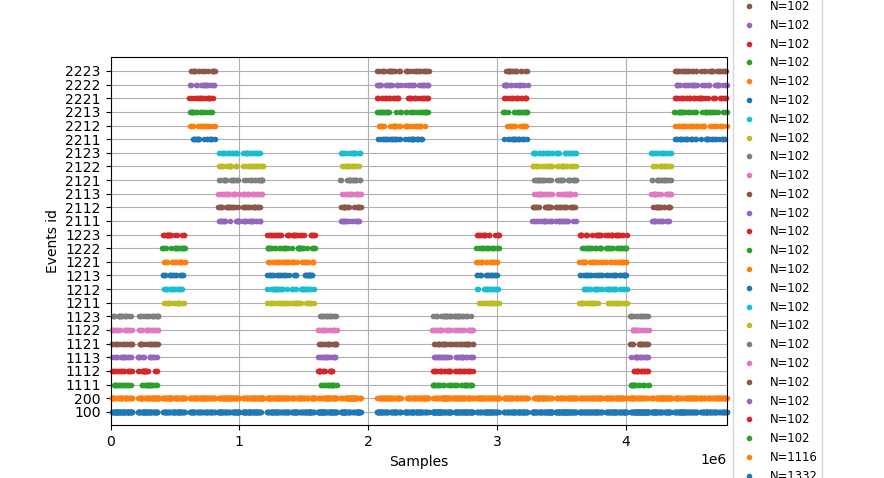

In [16]:
mne.viz.plot_events(stim_rep_evts);

### Detecting and annotating breaks

In the two following cells I mark the period of breaks between the block. I do it because we cannot use these periods in the ICA because they are highly noisy, hence I annotate them and exclude them from the following ICA analysis. I define a break as a duration of more than 10 sec between a response and a stimulus trigger (the duration might be different for other subjects but 10 seconds catches the number of expected breaks)

In [17]:
onset_breaks = stim_rep_evts[np.where(np.diff(stim_rep_evts[:,0], n=1) > (1024*10))][:,0]/1024 #detecting latencies between triggers > 5 sec (searching for the 23 self-paced breaks, and the start of the recording)
offset_breaks = np.flip(np.flip(stim_rep_evts)[np.where(np.diff(np.flip(stim_rep_evts[:,0]), n=1) < -(1024*10))])[:,0]/1024

onset_breaks = onset_breaks + 1 #add 1 sec after last response trigger
offset_breaks = offset_breaks - 1 #removes 1 sec before next stimulus trigger

onset_breaks = np.insert(onset_breaks,0,0)#just adding start of the recording to the breaks
onset_breaks = np.insert(onset_breaks,-1, stim_rep_evts[-1,0]/1024+1)#just adding end of the recording to the breaks

offset_breaks = np.insert(offset_breaks,0,stim_rep_evts[0,0]/1024-1)#just adding start of the recording to the breaks
offset_breaks = np.insert(offset_breaks,-1, raw.times.max())#just adding end of the recording to the breaks



duration_breaks = np.asarray(offset_breaks) - np.asarray(onset_breaks)


print(len(duration_breaks))

25


25 breaks = 23 self paced breaks + beginning of recording + end of recording

In [18]:
#Note I have to add a dummy "BAD_" marker in order to use this category in the visual window (because I'm using plt widget)
break_annot = mne.Annotations(onset= np.insert(onset_breaks, len(onset_breaks), 0),
                           duration= np.insert(duration_breaks, len(onset_breaks), 1),
                           description=np.insert(np.repeat(['BAD_breaks'], len(onset_breaks)),len(onset_breaks), 'BAD_'))
filt_raw.set_annotations(break_annot)

<RawEDF | S13.bdf, 72 x 4797440 (4685.0 s), ~2.57 GB, data loaded>

## visual artifact rejection

event trigger color code

In [19]:
color_dict = {k:'b' for k in combined_id}
color_dict.update({100:'r', 200:'r'})

Channel order (as we are mainly interesetd with visual latencies I plot the channels from posterior to anterior)

In [20]:
channels = dict(zip(raw.ch_names, np.arange(len(raw.ch_names))))

ch_order= [70,71, 27,63,28,26,61,62,29,24,25,60,59,58,57,56,30,19,20,21,22,23,\
           52,53,54,55,31,18,17,16,15,51,50,49,48,47,11,12,13,14,42,43,44,45,46,\
           10,9,8,7,41,40,39,38,37,3,4,5,6,34,35,36,2,1,33,32,0]


### Visualisation window

Brief summary of my artifact rejection philosophy : - 
- Rejecting very rare artifacts present on ROI (mainly visual and motor cortices) in the timing of interest (a bit before stim to a bit after rep)
- I mark when blinks/saccades are during stim presentation as information is delayed/biased (I therefore also display EOG)
- Rejecting rare high variance artifacts (e.g. EMG on all channels) to avoid that these obvious artifact be picked by the ICA
- Keeping recurrent artifacts likely to get picked up by artifact 

So in few words : avoid biasing ERPs and ease the following ICA, mark as less as possible because I want to reject epochs with ICA survival artifacts after all the preprocessing

<IPython.core.display.Javascript object>


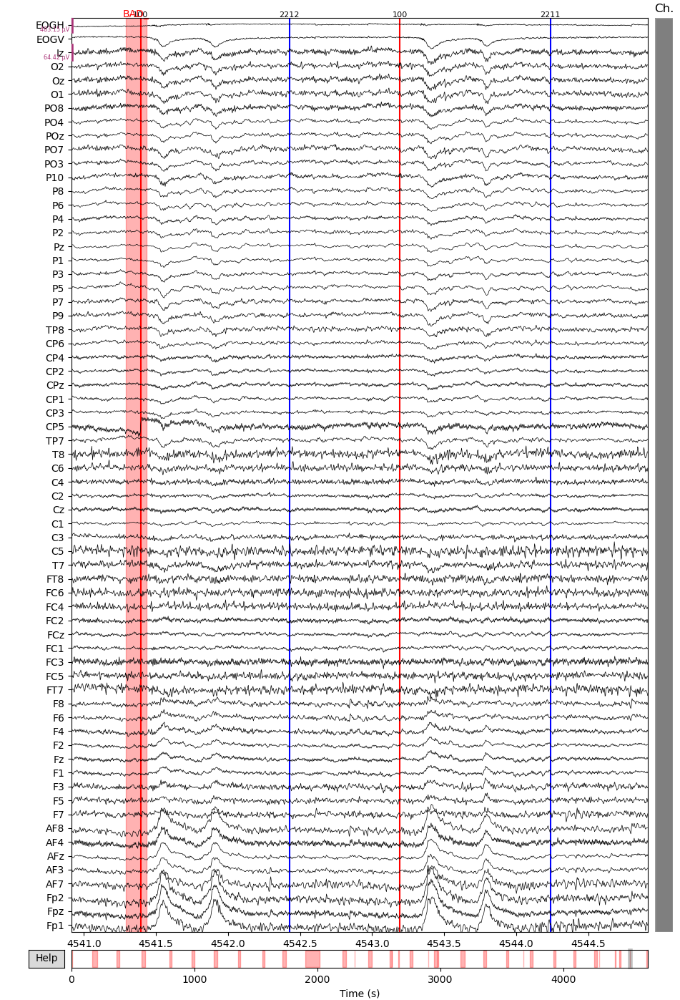

In [25]:
filt_raw.plot(events=stim_rep_evts, event_color=color_dict, remove_dc=True, order=ch_order, title="Artifact rejection window");

Notes based on raw inspection : 
- Recurrent spikes shareed with EOG on many electrodes
- Ryhtmic artifact on F3, F5, ECG ?

Number of annotation + saving

In [24]:
filt_raw.annotations

<Annotations | 36 segments: BAD_ (11), BAD_breaks (25)>

In [25]:
filt_raw.annotations.save('%s/saved_annotations_%s.csv'%(name_subj,name_subj))
#annot_from_file = mne.read_annotations('saved-annotations.csv')
#print(annot_from_file)

Saving the (high-pass filtered) data with the annotations for breaks and artifact

In [26]:
filt_raw.save("%s/pre_ica_%s.fif"%(name_subj,name_subj),overwrite=True)

Writing /home/gweindel/ownCloud/PhD/Projets/ForceEEG/processing_EEG/preprocessing/S13/pre_ica_S13.fif


<ipython-input-26-b5f5a09c0b2f>:1: RuntimeWarning: This filename (/home/gweindel/ownCloud/PhD/Projets/ForceEEG/processing_EEG/preprocessing/S13/pre_ica_S13.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz or _meg.fif
  filt_raw.save("%s/pre_ica_%s.fif"%(name_subj,name_subj),overwrite=True)


Closing /home/gweindel/ownCloud/PhD/Projets/ForceEEG/processing_EEG/preprocessing/S13/pre_ica_S13.fif [done]


# Fitting ICA

In [2]:
filt_raw = mne.io.read_raw_fif("%s/pre_ica_%s.fif"%(name_subj,name_subj), preload=True)

Opening raw data file S13/pre_ica_S13.fif...


<ipython-input-2-a412b60167ca>:1: RuntimeWarning: This filename (S13/pre_ica_S13.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz or _meg.fif
  filt_raw = mne.io.read_raw_fif("%s/pre_ica_%s.fif"%(name_subj,name_subj), preload=True)


    Range : 0 ... 4797439 =      0.000 ...  4684.999 secs
Ready.
Reading 0 ... 4797439  =      0.000 ...  4684.999 secs...


In [3]:
ica = mne.preprocessing.ICA(max_pca_components = 64-len(filt_raw.info["bads"])-1) #-1 because better when average reference is used (rank)
ica.fit(filt_raw.crop(tmax=filt_raw.times.max()), reject_by_annotation=True, decim=2)
        #I use decim=2 to downsample to 512Hz because ICA eats up a lot of RAM For this subjct I also crop the 1000 last seconds for that reason

Fitting ICA to data using 64 channels (please be patient, this may take a while)
Omitting 674739 of 4797440 (14.06%) samples, retaining 4122701 (85.94%) samples.
Selecting all PCA components: 63 components
Fitting ICA took 255.0s.


<ICA  |  raw data decomposition, fit (fastica): 2061351 samples, 63 components, channels used: "eeg">

In [4]:
ica.save("%s/ICA_object_%s.fif"%(name_subj,name_subj))

Writing ICA solution to S13/ICA_object_S13.fif...


<ipython-input-4-999a4b462724>:1: RuntimeWarning: This filename (S13/ICA_object_S13.fif) does not conform to MNE naming conventions. All ICA files should end with -ica.fif, -ica.fif.gz, _ica.fif or _ica.fif.gz
  ica.save("%s/ICA_object_%s.fif"%(name_subj,name_subj))


<ICA  |  raw data decomposition, fit (fastica): 2061351 samples, 63 components, channels used: "eeg">

# Inspecting ICA

__Nota Bene__ : I fitted the ICA on the filtered continuous data, however I want to know how the ICA cleaned the epoched data, hence I inspect the ICA components mainly on the epoched data from the raw data (no low-pass filter other than the one used by biosemi, 0.01 Hz right ?)

In [2]:
raw = mne.io.read_raw_fif("%s/pre_rejection_%s.fif"%(name_subj,name_subj), preload=False)

Opening raw data file S13/pre_rejection_S13.fif...


<ipython-input-2-51b23dce2bfc>:1: RuntimeWarning: This filename (S13/pre_rejection_S13.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz or _meg.fif
  raw = mne.io.read_raw_fif("%s/pre_rejection_%s.fif"%(name_subj,name_subj), preload=False)


    Range : 0 ... 4797439 =      0.000 ...  4684.999 secs
Ready.


In [3]:
annot_from_file = mne.read_annotations('%s/saved_annotations_%s.csv'%(name_subj,name_subj))
raw.set_annotations(annot_from_file)
print(raw.annotations)

<Annotations | 36 segments: BAD_ (11), BAD_breaks (25)>


In [4]:
ica = mne.preprocessing.read_ica("%s/ICA_object_%s.fif"%(name_subj,name_subj))

Reading S13/ICA_object_S13.fif ...
Now restoring ICA solution ...


<ipython-input-4-c4cd4f34906e>:1: RuntimeWarning: This filename (S13/ICA_object_S13.fif) does not conform to MNE naming conventions. All ICA files should end with -ica.fif, -ica.fif.gz, _ica.fif or _ica.fif.gz
  ica = mne.preprocessing.read_ica("%s/ICA_object_%s.fif"%(name_subj,name_subj))


Ready.


### Visualizing on epochs

In [5]:
trig_id = {'low/speed/left/1':1111,'low/speed/left/2':1112,'low/speed/left/3':1113,
           'low/speed/right/1':1121,'low/speed/right/2':1122,'low/speed/right/3':1123,
           'low/accuracy/left/1':1211,'low/accuracy/left/2':1212,'low/accuracy/left/3':1213,
           'low/accuracy/right/1':1221,'low/accuracy/right/2':1222,'low/speed/accuracy/3':1223,
          'high/speed/left/1':2111,'high/speed/left/2':2112,'high/speed/left/3':2113,
           'high/speed/right/1':2121,'high/speed/right/2':2122,'high/speed/right/3':2123,
           'high/accuracy/left/1':2211,'high/accuracy/left/2':2212,'high/accuracy/left/3':2213,
           'high/accuracy/right/1':2221,'high/accuracy/right/2':2222,'high/speed/accuracy/3':2223,} # used for segmentation

original_evts = pd.read_csv('%s/events_%s.csv'%(name_subj, name_subj), index_col=0)

evts = original_evts.values
evts[:,2] = evts[:,1]

epochs_ica = mne.Epochs(raw, evts, event_id=trig_id, tmin=-0.5, tmax=1, preload=True)

2448 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 2448 events and 1537 original time points ...
13 bad epochs dropped


In [6]:
epochs_ica.resample(500)

<Epochs  |   2435 events (all good), -0.5 - 0.998 sec, baseline [None, 0], ~1003.8 MB, data loaded,
 'high/accuracy/left/1': 100
 'high/accuracy/left/2': 102
 'high/accuracy/left/3': 100
 'high/accuracy/right/1': 100
 'high/accuracy/right/2': 101
 'high/speed/accuracy/3': 102
 'high/speed/left/1': 102
 'high/speed/left/2': 102
 'high/speed/left/3': 102
 'high/speed/right/1': 102
 'high/speed/right/2': 102
 'high/speed/right/3': 102
 'low/accuracy/left/1': 101
 'low/accuracy/left/2': 101
 'low/accuracy/left/3': 102
 'low/accuracy/right/1': 101
 'low/accuracy/right/2': 102
 'low/speed/accuracy/3': 102
 'low/speed/left/1': 102
 'low/speed/left/2': 102
 'low/speed/left/3': 101
 'low/speed/right/1': 101
 'low/speed/right/2': 101
 'low/speed/right/3': 102>

### ICs epoch timecourse


<IPython.core.display.Javascript object>


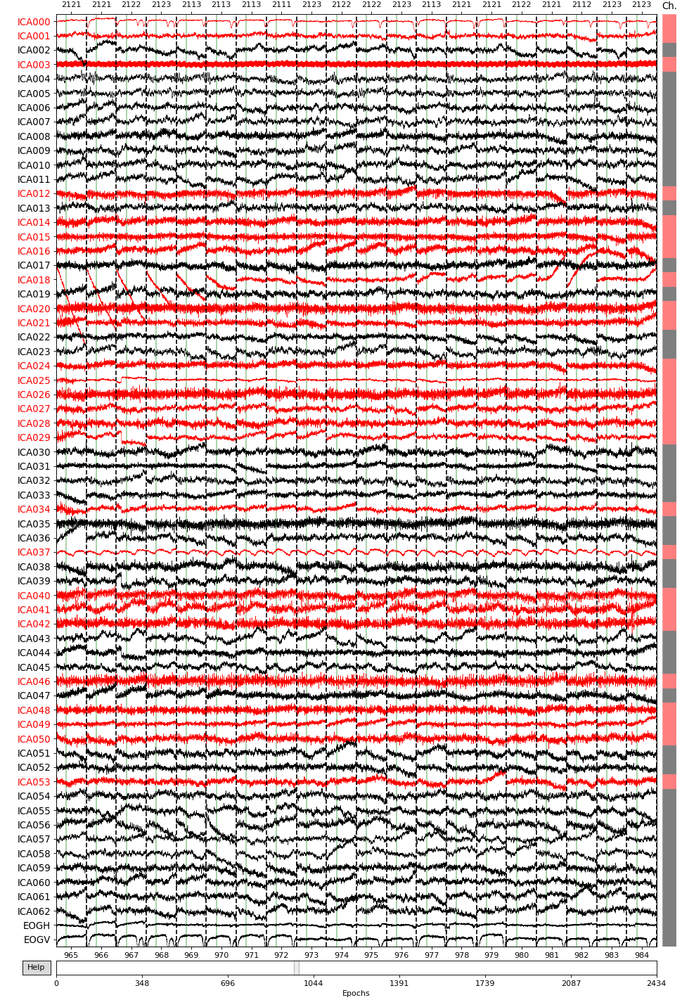

In [7]:
ica.plot_sources(epochs_ica);

__Nota Bene__ : epochs are dropped if artifact is in the epoch window

Notes from epoch time course of the ICs : 
- Eyes : 0,1,27
- EMG : 12,14, 15, 16,20,21,24,25,28,29,34,40,41,42,46,48,49,53
- Suspicous : 3,18,25,37,50

In [8]:
#Comp to inspect based on IC timecourse
comp_to_inspect = np.array([0,1,27,12,14, 15, 16,20,21,24,25,28,29,34,40,41,42,46,48,49,53,3,18,25,37,50])
comp_to_inspect = np.sort(np.unique(comp_to_inspect))
print(comp_to_inspect)

[ 0  1  3 12 14 15 16 18 20 21 24 25 27 28 29 34 37 40 41 42 46 48 49 50
 53]


### ICs topomap

<IPython.core.display.Javascript object>


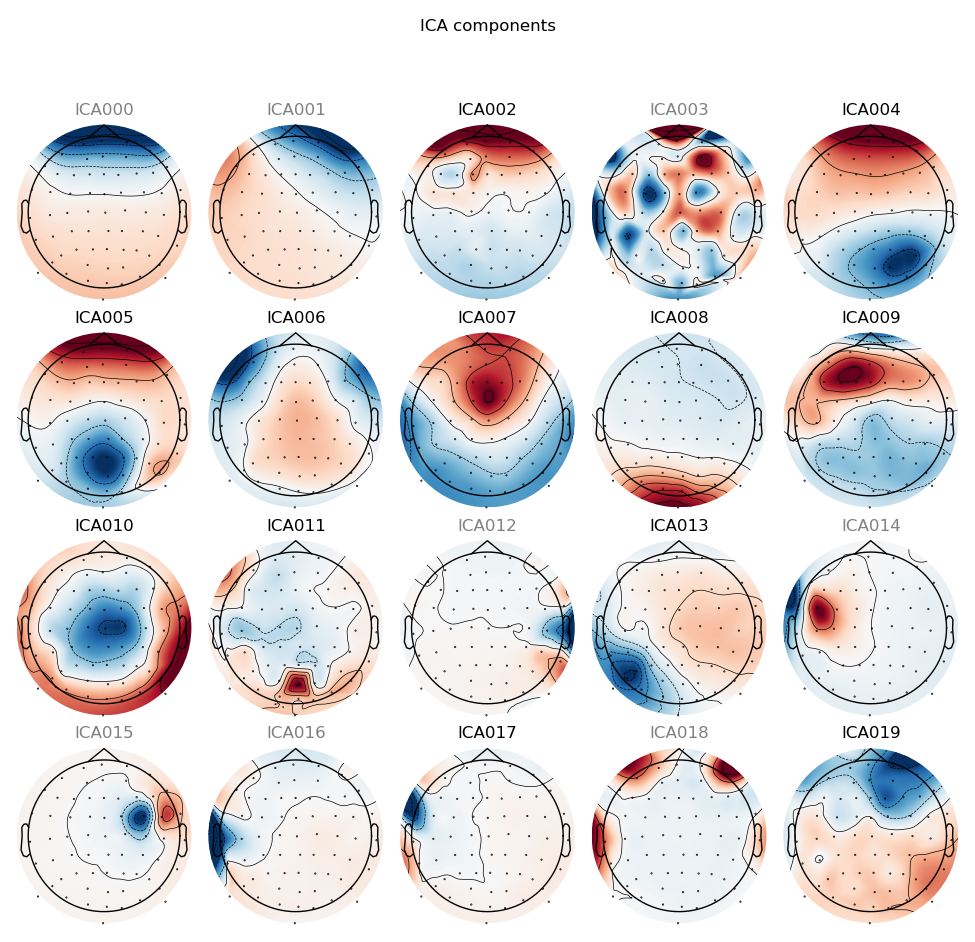

<IPython.core.display.Javascript object>


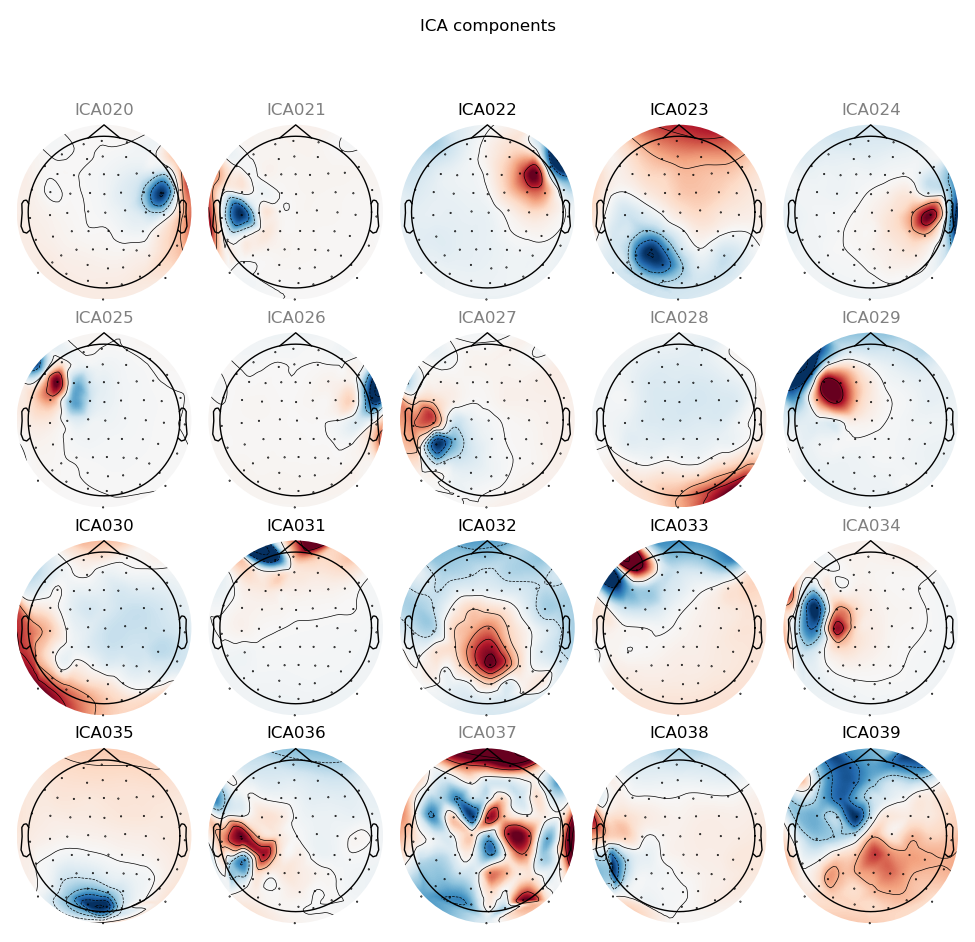

<IPython.core.display.Javascript object>


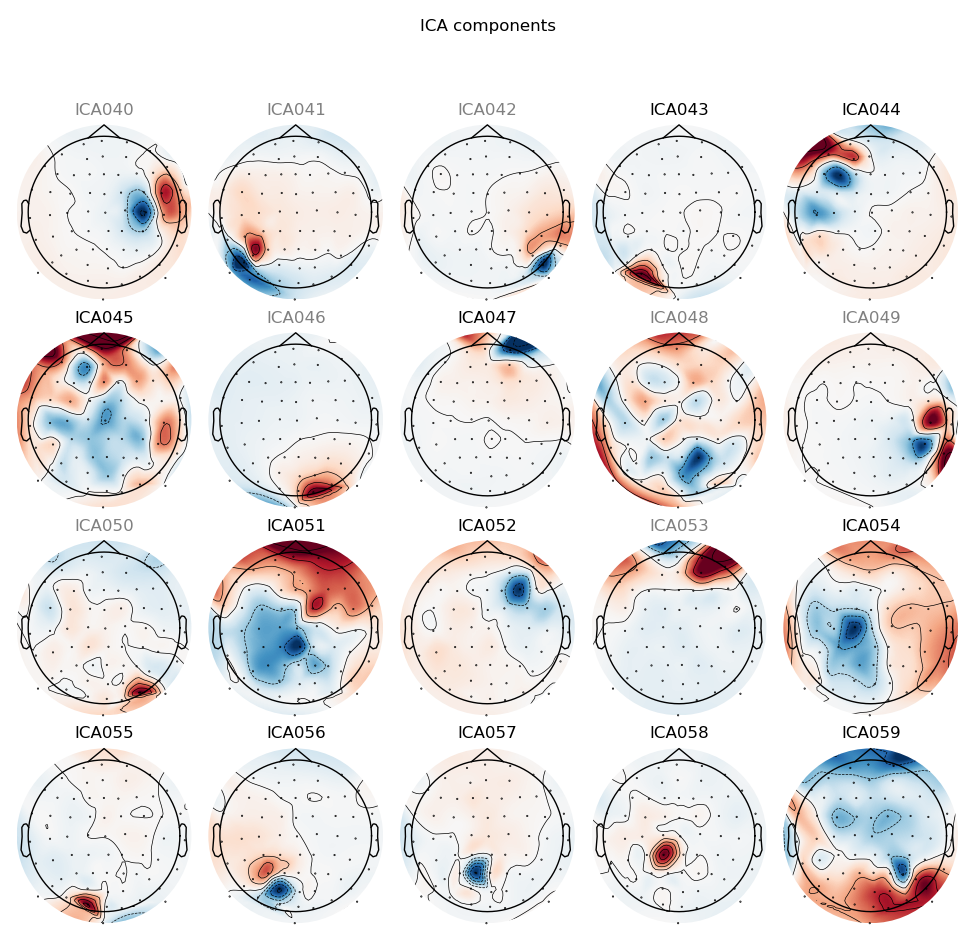

<IPython.core.display.Javascript object>


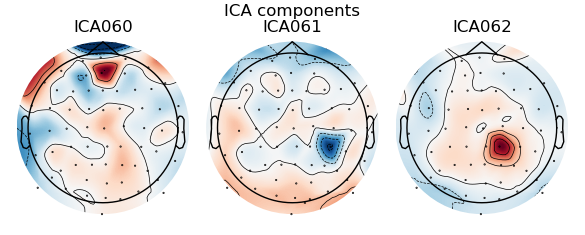

In [9]:
ica.plot_components();

Notes on ICs based on topomap  : 
- Blinks : 0,1,
- Suspicious : 
- saccades/face EMG : 2,3,6,18,19,31,33,44,45,47,51,53,60
- TP EMG :  12,16,17,26,49,
- channel noise : 


In [10]:
comp_to_inspect = np.append(comp_to_inspect, [0,1,2,3,6,18,19,31,33,44,45,47,51,53,60,12,16,17,26,49])
comp_to_inspect = np.sort(np.unique(comp_to_inspect))
print(comp_to_inspect)

[ 0  1  2  3  6 12 14 15 16 17 18 19 20 21 24 25 26 27 28 29 31 33 34 37
 40 41 42 44 45 46 47 48 49 50 51 53 60]


## Individual ICs inspection

During the next lines I inspect each EOG, EMG or suspicious IC and decide, after the plots of each category, wether to KEEP or to REJECT the IC

### EOG : Checking against recorded EOG (horizontal and vertical)

This section looks at the covariation between the recorded EOG (horizontal and vertical) and the extracted ICs to find those ICs that likely contains eyes artifacts

In [11]:
filt_raw = mne.io.read_raw_fif("%s/pre_ica_%s.fif"%(name_subj,name_subj), preload=True)

eog_indices, eog_scores = ica.find_bads_eog(filt_raw.resample(500))
ica.exclude = eog_indices

Opening raw data file S13/pre_ica_S13.fif...


<ipython-input-11-af9efacd6f55>:1: RuntimeWarning: This filename (S13/pre_ica_S13.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz or _meg.fif
  filt_raw = mne.io.read_raw_fif("%s/pre_ica_%s.fif"%(name_subj,name_subj), preload=True)


    Range : 0 ... 4797439 =      0.000 ...  4684.999 secs
Ready.
Reading 0 ... 4797439  =      0.000 ...  4684.999 secs...
Trigger channel has a non-zero initial value of 66304 (consider using initial_event=True to detect this event)
7344 events found
Event IDs: [769 770 868 879 880 881 889 890 891 968 979 980 981 989 990 991]
Trigger channel has a non-zero initial value of 66304 (consider using initial_event=True to detect this event)
7288 events found
Event IDs: [769 770 868 879 880 881 889 890 891 968 979 980 981 989 990 991]
Omitting 329462 of 2342500 (14.06%) samples, retaining 2013038 (85.94%) samples.
Omitting 329462 of 2342500 (14.06%) samples, retaining 2013038 (85.94%) samples.
Omitting 329462 of 2342500 (14.06%) samples, retaining 2013038 (85.94%) samples.


<ipython-input-11-af9efacd6f55>:3: RuntimeWarning: Resampling of the stim channels caused event information to become unreliable. Consider finding events on the original data and passing the event matrix as a parameter.
  eog_indices, eog_scores = ica.find_bads_eog(filt_raw.resample(500))


... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 8192 samples (16.384 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 8192 s

Now I plot the scores, namely the "covariance" between HEOG (top panel), VEOG (lower panel) and the ICs (x axis)

<IPython.core.display.Javascript object>


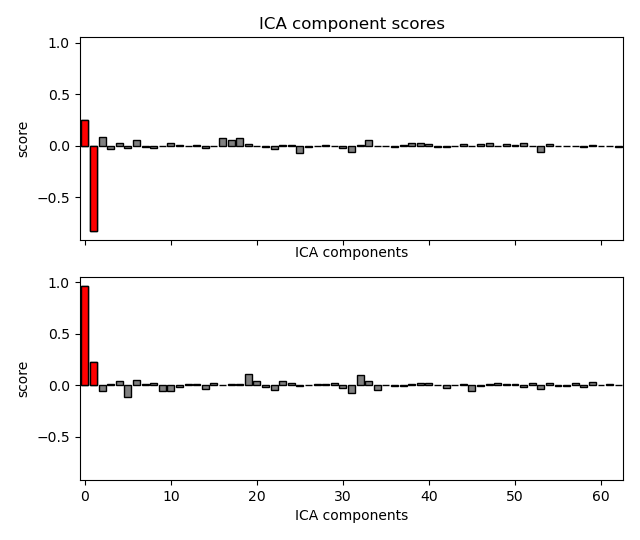

In [12]:
ica.plot_scores(eog_scores);

MNE's algorithm extracted automatically the following ICs :

In [13]:
eog_indices

[0, 1]

Now I plot for each of these components the topomap; the activity for the created epochs around the stimulus (presentation of the stimuls at 0.2 sec); the spectrum, and the variance of the IC measured at each epoch (watch out the y-axis of this last plot varies a lot across ICs)

In [14]:
inspected_comp = np.array([0, 1])

<IPython.core.display.Javascript object>


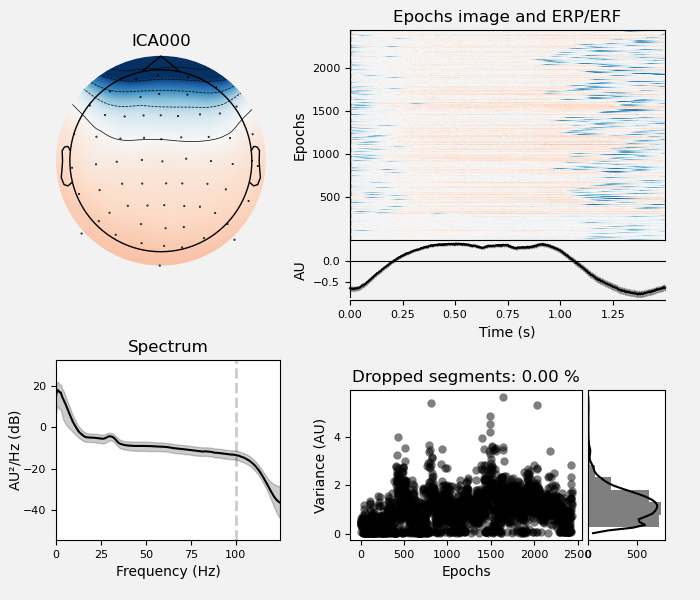

    Using multitaper spectrum estimation with 7 DPSS windows
2435 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


<IPython.core.display.Javascript object>


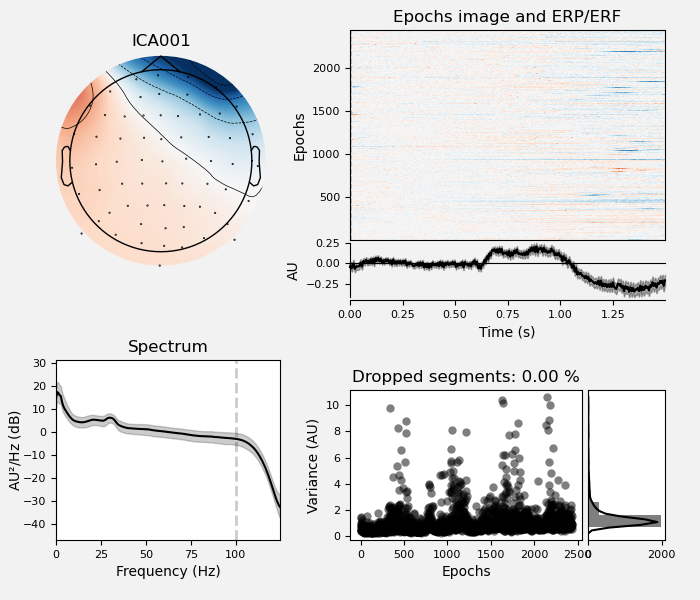

2435 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


In [15]:
ica.plot_properties(epochs_ica, picks=inspected_comp);

#### Interpretation of the EOG ICs
- ICA 0 contains blinks REJECT
- 1 = Saccades REJECT


In [16]:
ica.exclude = []
eog_comp = [0,1]
comp_to_inspect = comp_to_inspect[np.isin(comp_to_inspect, inspected_comp, invert=True)]

### EMG components

#### Suspected EMG activity from the face

from the notes above the general plot of the ICs (time course and topomap) I look at 2,3,6,18,19,31,33,44,45,47,51,53,60

In [17]:
inspected_comp = np.array([2,3,6,18,19,31,33,44,45,47,51,53,60])

<IPython.core.display.Javascript object>


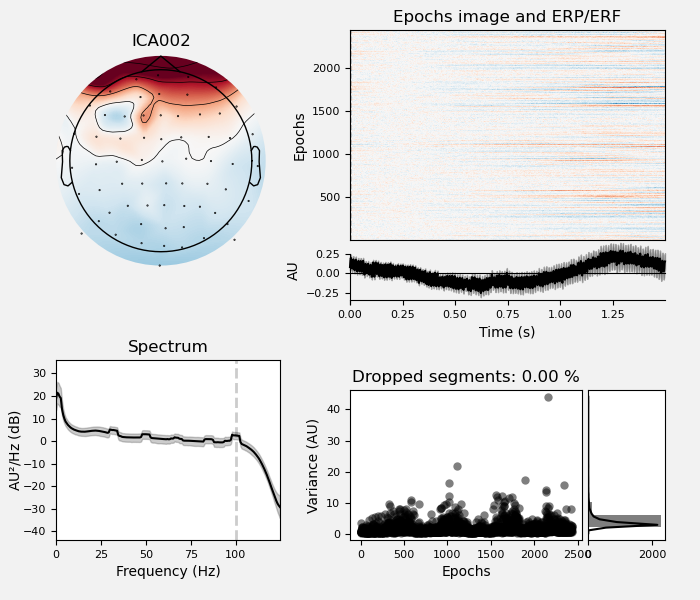

    Using multitaper spectrum estimation with 7 DPSS windows
2435 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


<IPython.core.display.Javascript object>


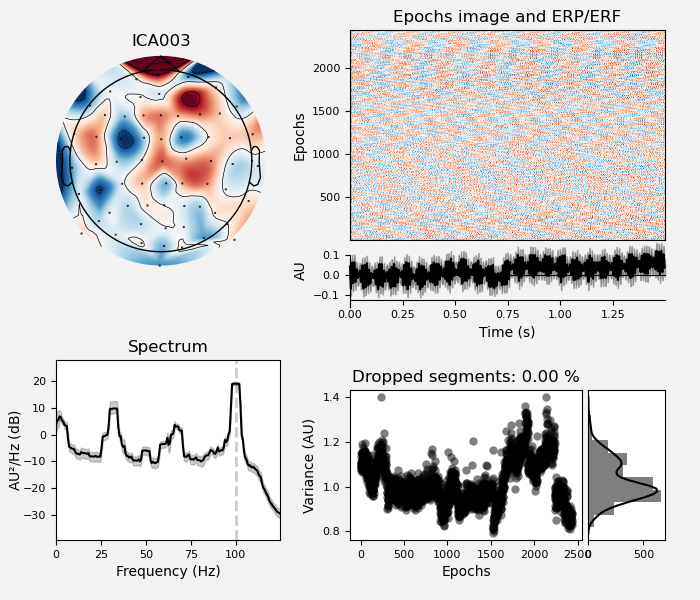

2435 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


<IPython.core.display.Javascript object>


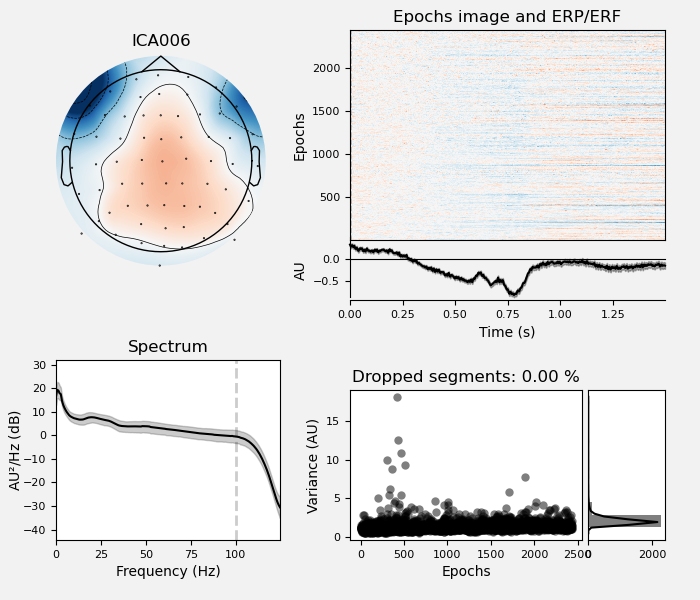

2435 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


<IPython.core.display.Javascript object>


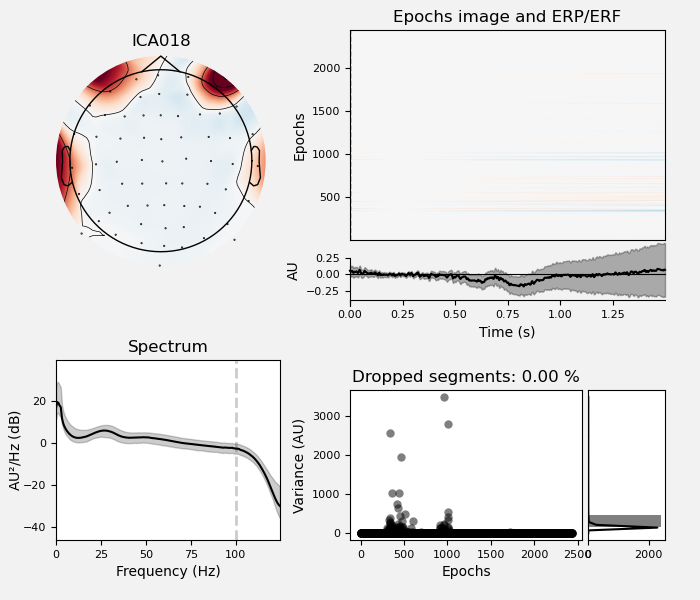

2435 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


<IPython.core.display.Javascript object>


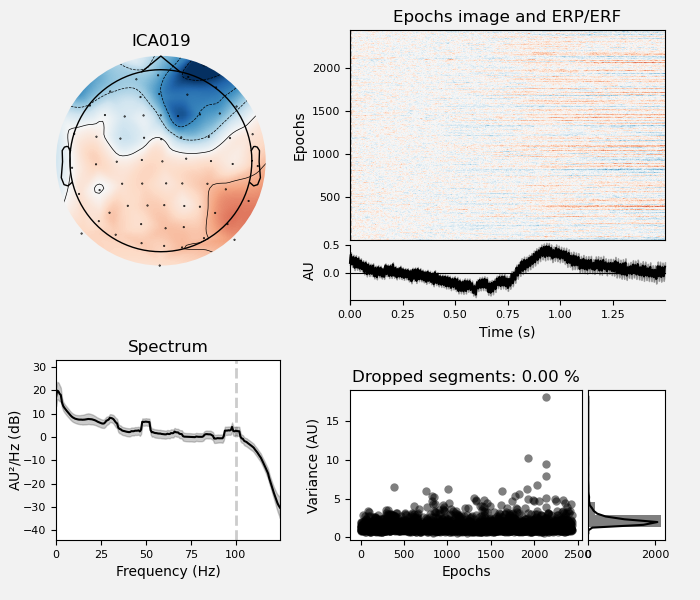

2435 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


<IPython.core.display.Javascript object>


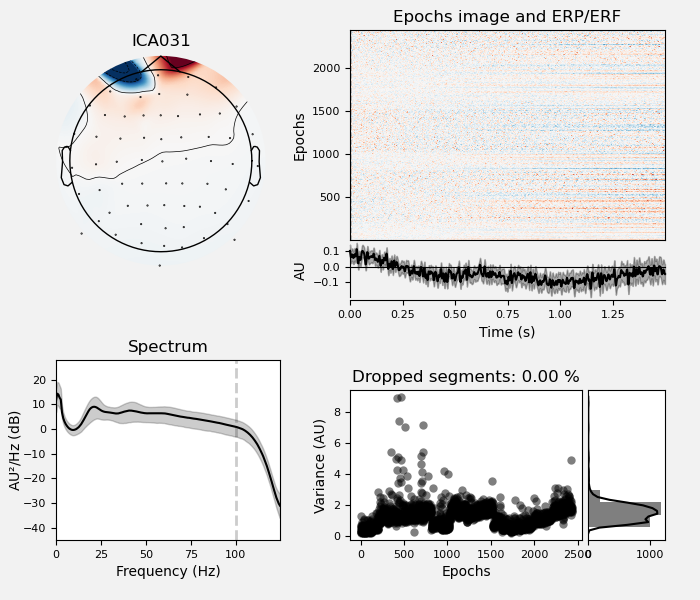

2435 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


<IPython.core.display.Javascript object>


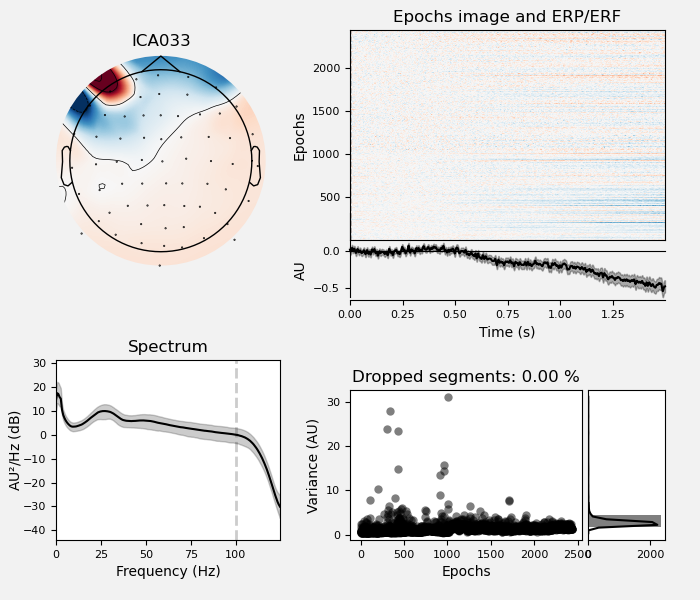

2435 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


<IPython.core.display.Javascript object>


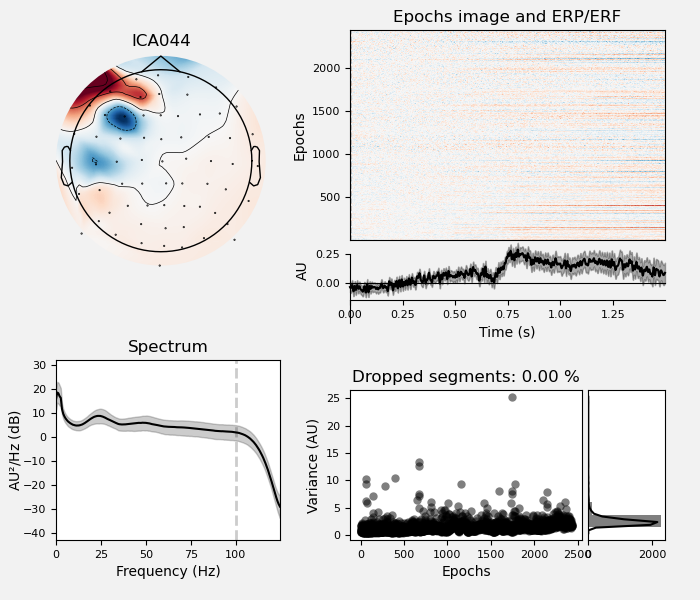

2435 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


<IPython.core.display.Javascript object>


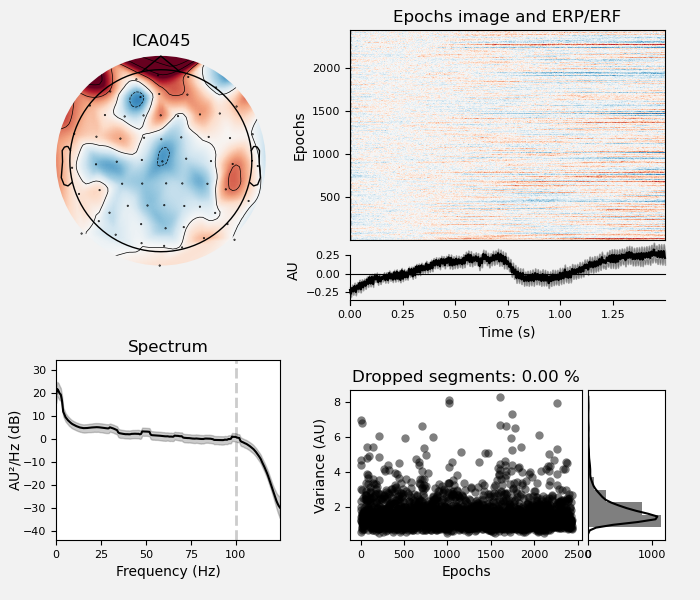

2435 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


<IPython.core.display.Javascript object>


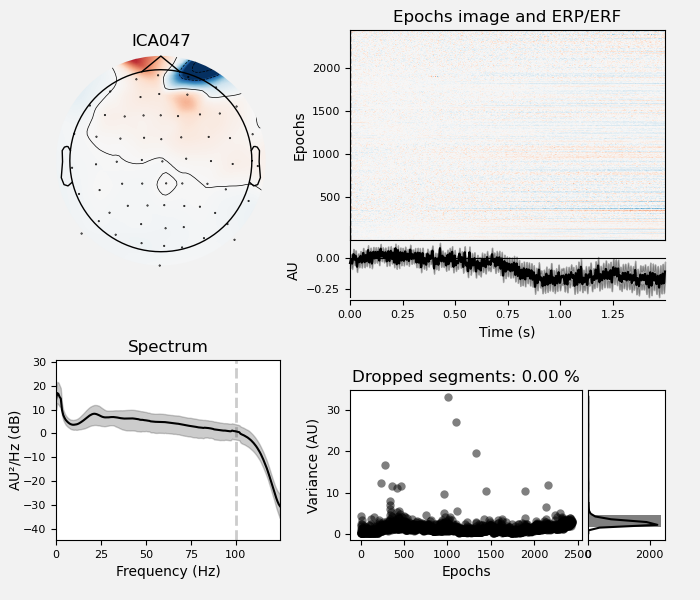

2435 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


<IPython.core.display.Javascript object>


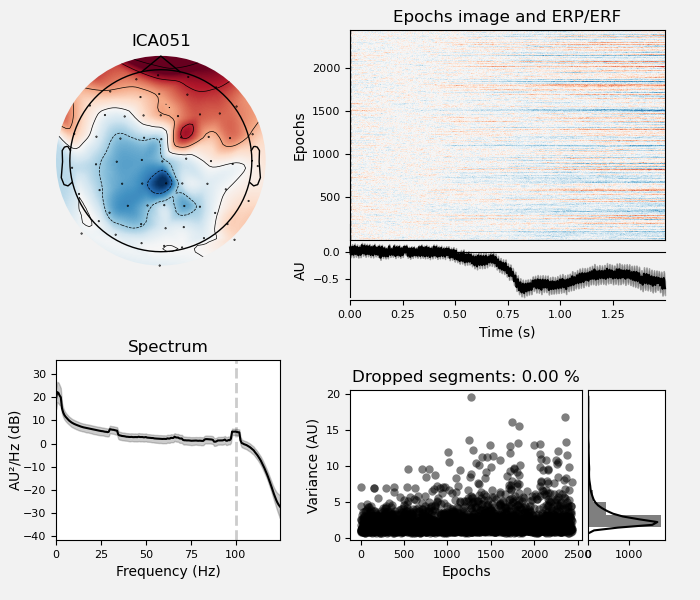

2435 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


<IPython.core.display.Javascript object>


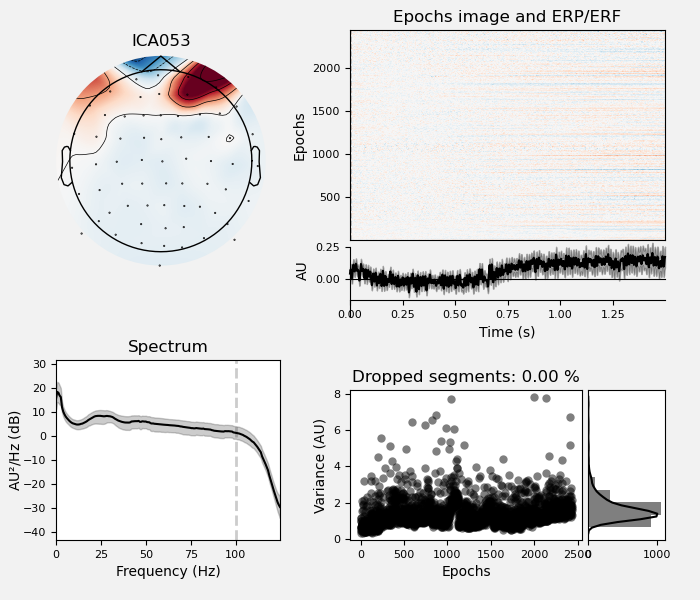

2435 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


<IPython.core.display.Javascript object>


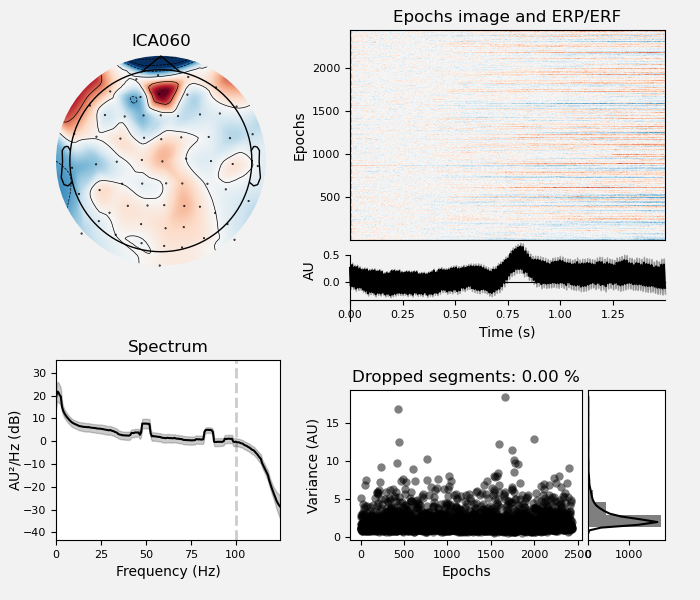

2435 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


In [18]:
ica.plot_properties(epochs_ica, picks=inspected_comp);

- ICA 2,45,60  Face topo, strange peak  in spectrum and high variance, REJECT
- 3 : artifact with chaotic spectrum, mainly external topo, REJECT
- 6 face EMG but not enogh evidence and low var, KEEP
- 18 EMG from face/neck, huge variance in some epochs, REJECT
- 19 multiple peaks in spectrum, topo far from ROI and mainly face, REJECT
- 31,33,47,53 clear face EMG REJECT
- 44 face EMG but also spans on ROI, relative low var, KEEP
- 51 weird spectrim with peaks mainly face but still spans to ROI, relative low var KEEP

In [19]:
face_emg_comp = [2,45,60,3,18,19,31,33,47,53,]
comp_to_inspect = comp_to_inspect[np.isin(comp_to_inspect, inspected_comp, invert=True)]

#### Other suspected EMGs

In [20]:
inspected_comp = np.array([12,16,17,26,49])

<IPython.core.display.Javascript object>


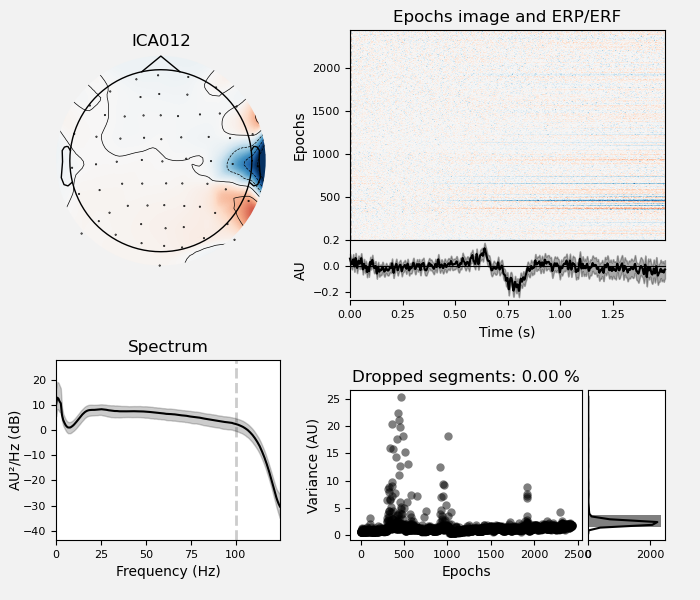

    Using multitaper spectrum estimation with 7 DPSS windows
2435 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


<IPython.core.display.Javascript object>


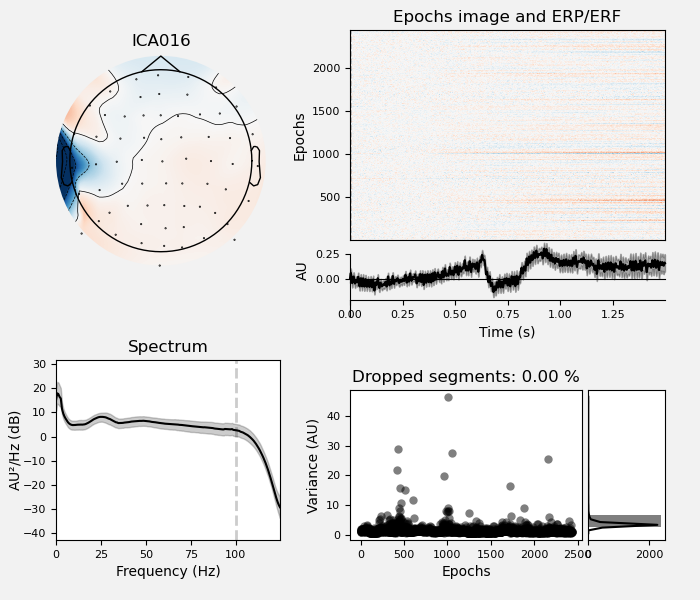

2435 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


<IPython.core.display.Javascript object>


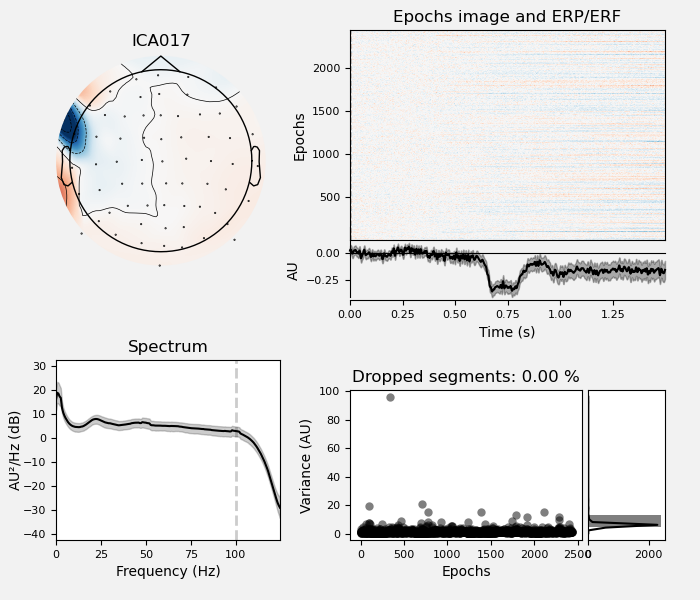

2435 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


<IPython.core.display.Javascript object>


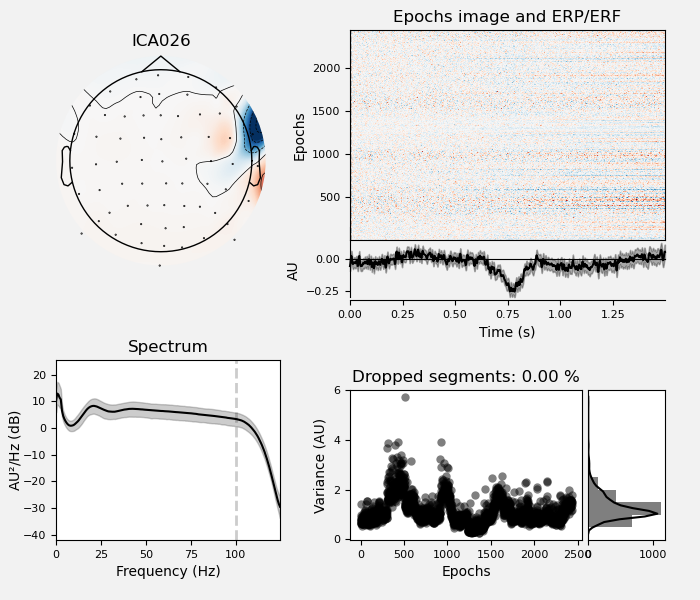

2435 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


/home/gweindel/anaconda3/envs/mne/lib/python3.8/site-packages/mne/viz/ica.py:115: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize, facecolor=[0.95] * 3)


<IPython.core.display.Javascript object>


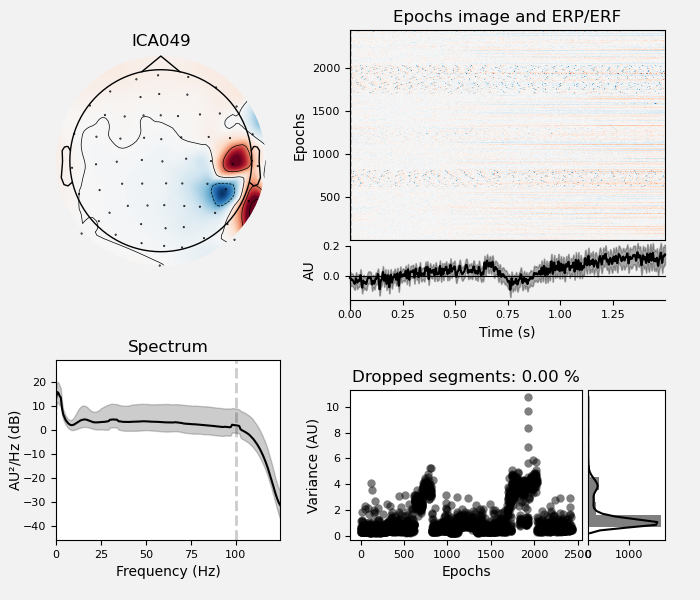

2435 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


In [21]:
ica.plot_properties(epochs_ica, picks=inspected_comp);

- ICA 12, TP EMG but not enough evidence, only problematic in a few epochs, KEEP
- 16,17,26 : TP/face EMG REJECT
- 49 : not enough evidence and close to ROI, KEEP


In [22]:
other_emg_comp = [16,17,26]
comp_to_inspect = comp_to_inspect[np.isin(comp_to_inspect, inspected_comp, invert=True)]

## Other strange components

In [23]:
print(comp_to_inspect)

[14 15 20 21 24 25 27 28 29 34 37 40 41 42 46 48 50]


/home/gweindel/anaconda3/envs/mne/lib/python3.8/site-packages/mne/viz/ica.py:115: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize, facecolor=[0.95] * 3)


<IPython.core.display.Javascript object>


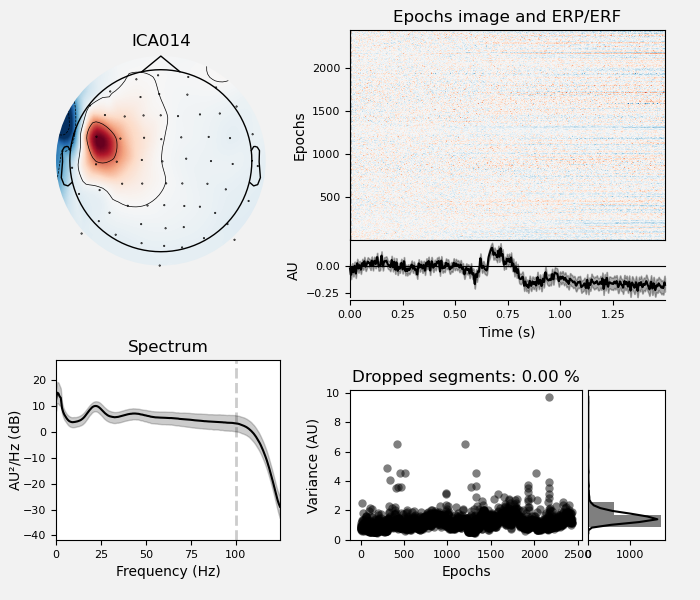

    Using multitaper spectrum estimation with 7 DPSS windows
2435 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


/home/gweindel/anaconda3/envs/mne/lib/python3.8/site-packages/mne/viz/ica.py:115: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize, facecolor=[0.95] * 3)


<IPython.core.display.Javascript object>


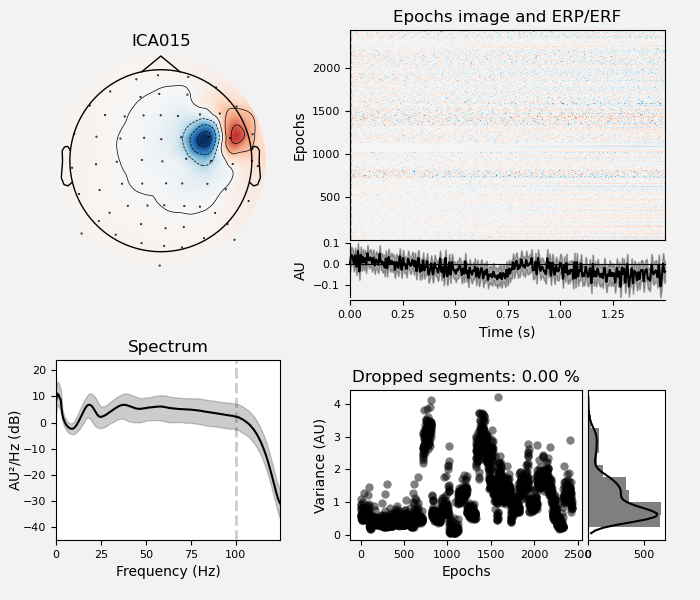

2435 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


/home/gweindel/anaconda3/envs/mne/lib/python3.8/site-packages/mne/viz/ica.py:115: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize, facecolor=[0.95] * 3)


<IPython.core.display.Javascript object>


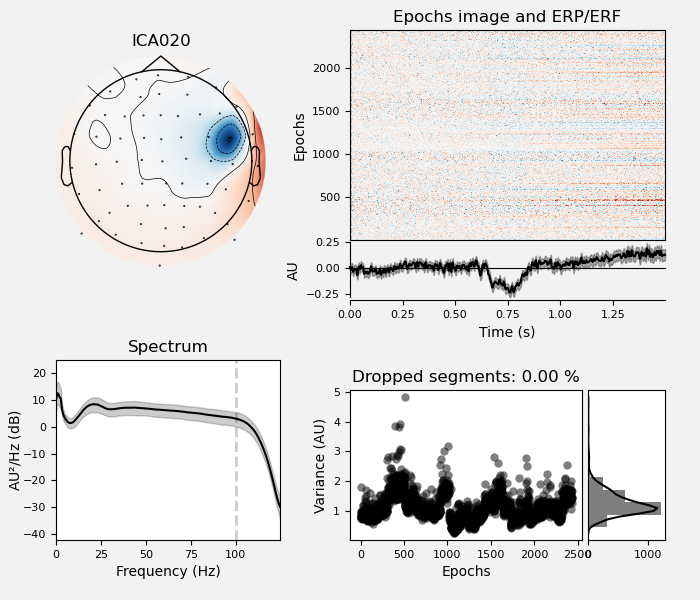

2435 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


/home/gweindel/anaconda3/envs/mne/lib/python3.8/site-packages/mne/viz/ica.py:115: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize, facecolor=[0.95] * 3)


<IPython.core.display.Javascript object>


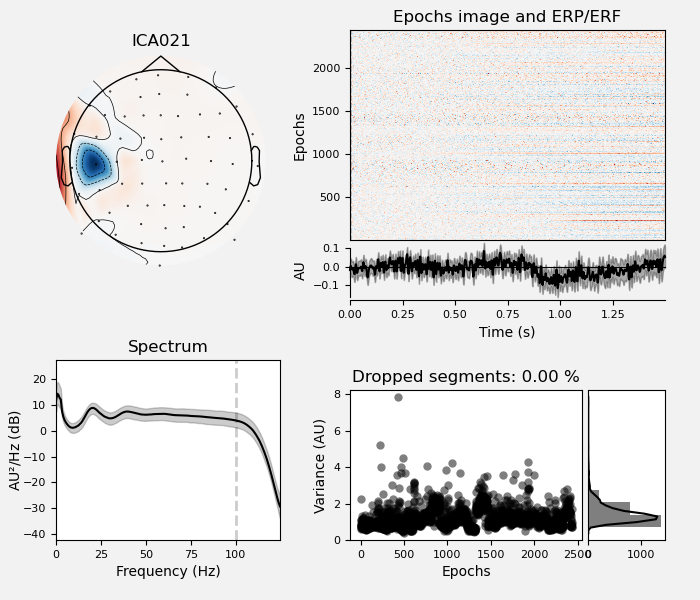

2435 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


/home/gweindel/anaconda3/envs/mne/lib/python3.8/site-packages/mne/viz/ica.py:115: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize, facecolor=[0.95] * 3)


<IPython.core.display.Javascript object>


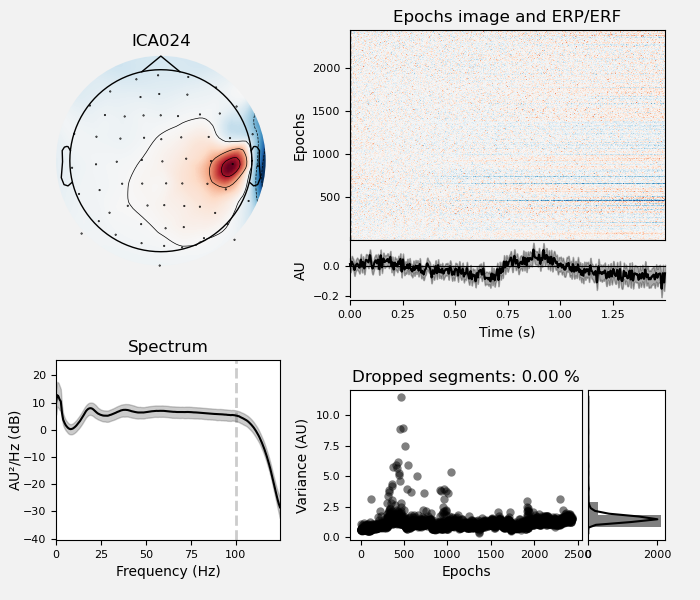

2435 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


/home/gweindel/anaconda3/envs/mne/lib/python3.8/site-packages/mne/viz/ica.py:115: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize, facecolor=[0.95] * 3)


<IPython.core.display.Javascript object>


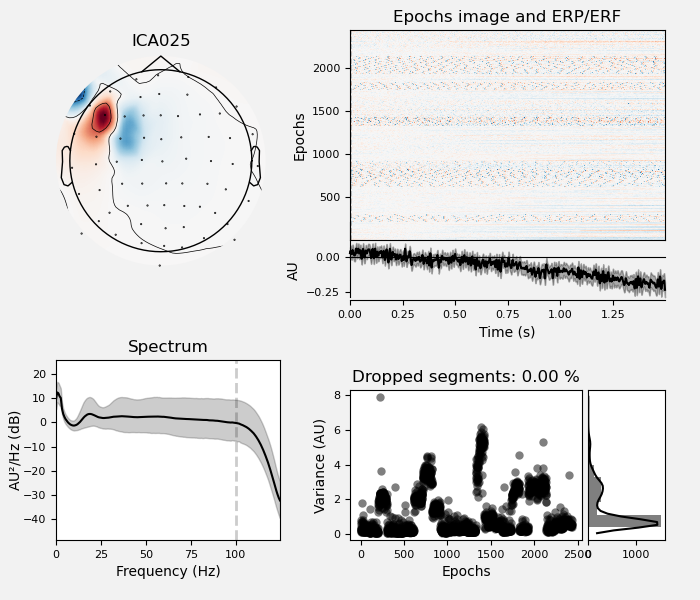

2435 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


/home/gweindel/anaconda3/envs/mne/lib/python3.8/site-packages/mne/viz/ica.py:115: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize, facecolor=[0.95] * 3)


<IPython.core.display.Javascript object>


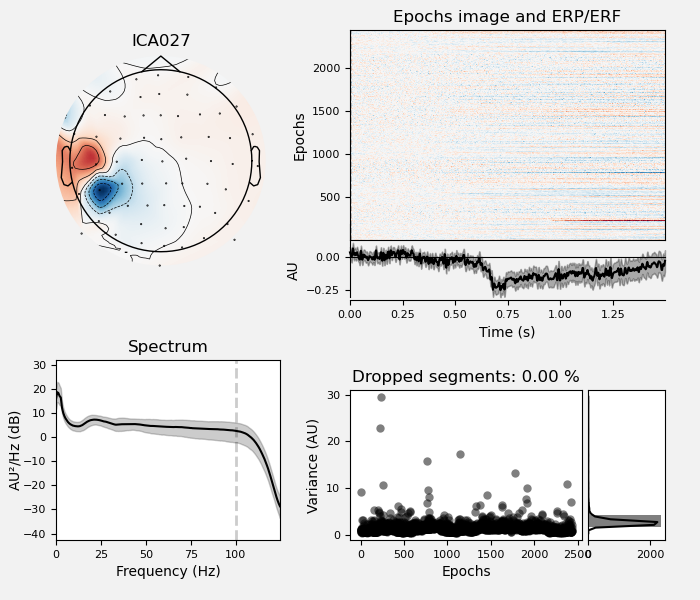

2435 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


/home/gweindel/anaconda3/envs/mne/lib/python3.8/site-packages/mne/viz/ica.py:115: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize, facecolor=[0.95] * 3)


<IPython.core.display.Javascript object>


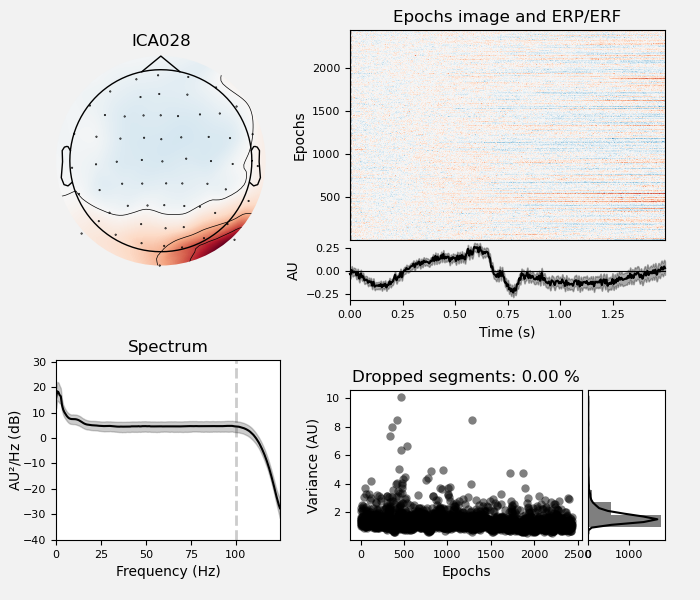

2435 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


/home/gweindel/anaconda3/envs/mne/lib/python3.8/site-packages/mne/viz/ica.py:115: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize, facecolor=[0.95] * 3)


<IPython.core.display.Javascript object>


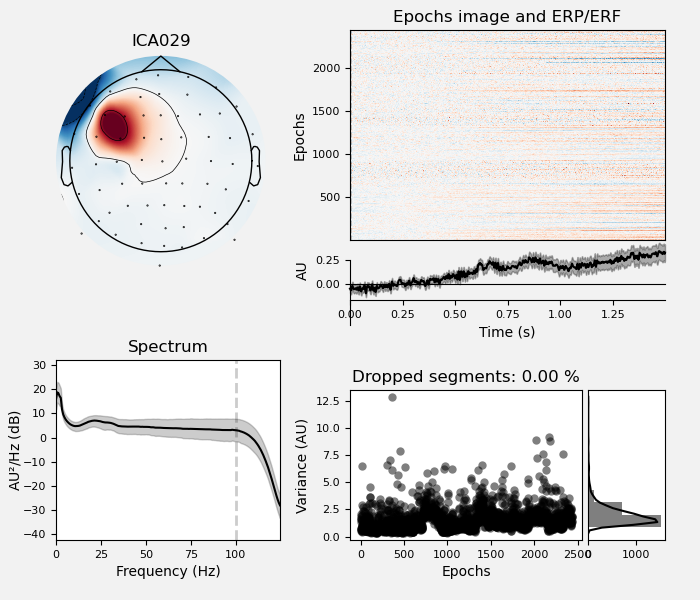

2435 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


/home/gweindel/anaconda3/envs/mne/lib/python3.8/site-packages/mne/viz/ica.py:115: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize, facecolor=[0.95] * 3)


<IPython.core.display.Javascript object>


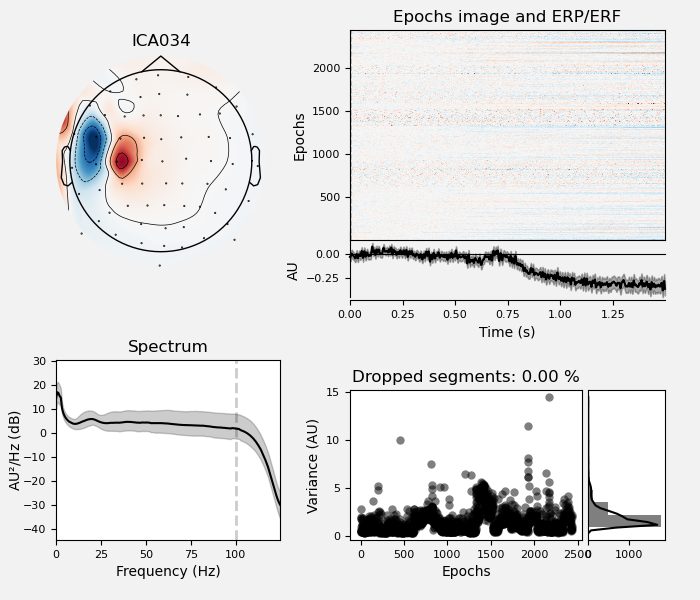

2435 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


/home/gweindel/anaconda3/envs/mne/lib/python3.8/site-packages/mne/viz/ica.py:115: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize, facecolor=[0.95] * 3)


<IPython.core.display.Javascript object>


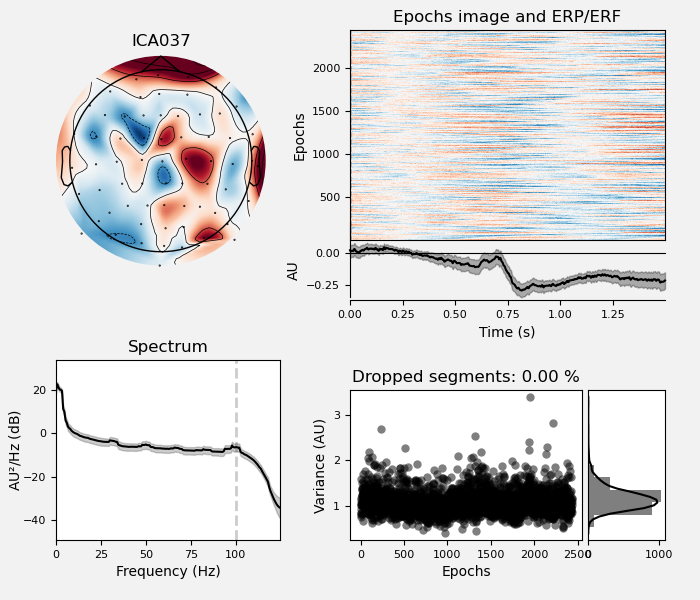

2435 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


/home/gweindel/anaconda3/envs/mne/lib/python3.8/site-packages/mne/viz/ica.py:115: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize, facecolor=[0.95] * 3)


<IPython.core.display.Javascript object>


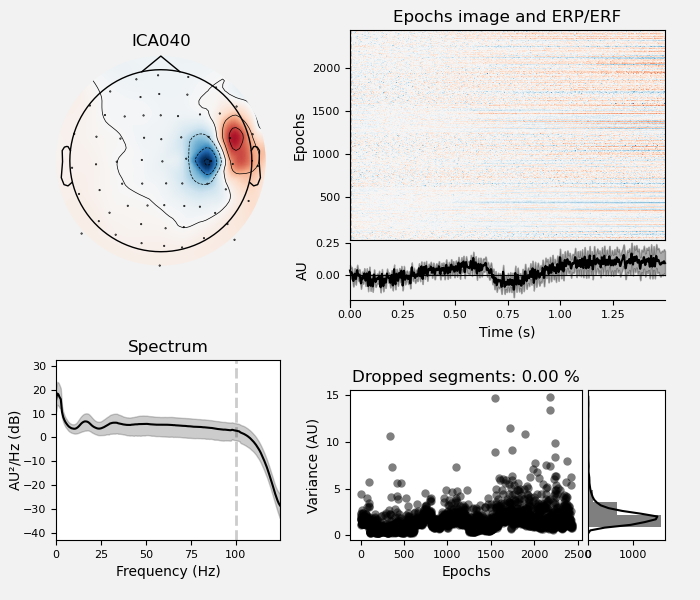

2435 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


/home/gweindel/anaconda3/envs/mne/lib/python3.8/site-packages/mne/viz/ica.py:115: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize, facecolor=[0.95] * 3)


<IPython.core.display.Javascript object>


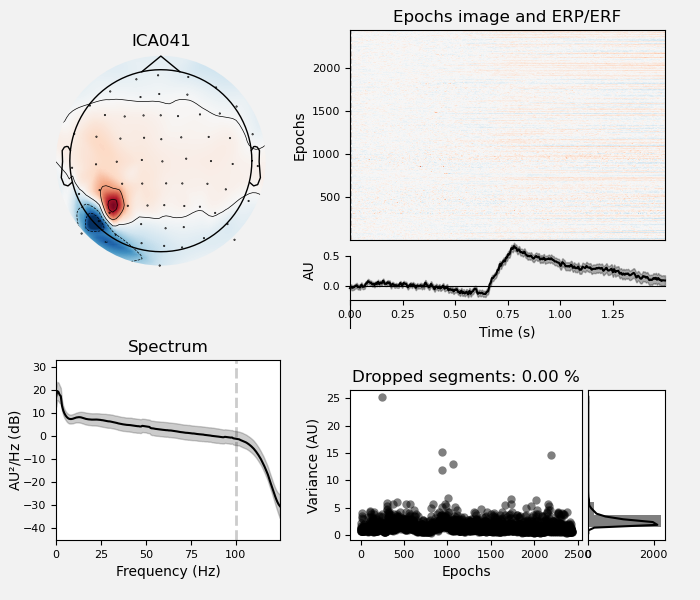

2435 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


/home/gweindel/anaconda3/envs/mne/lib/python3.8/site-packages/mne/viz/ica.py:115: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize, facecolor=[0.95] * 3)


<IPython.core.display.Javascript object>


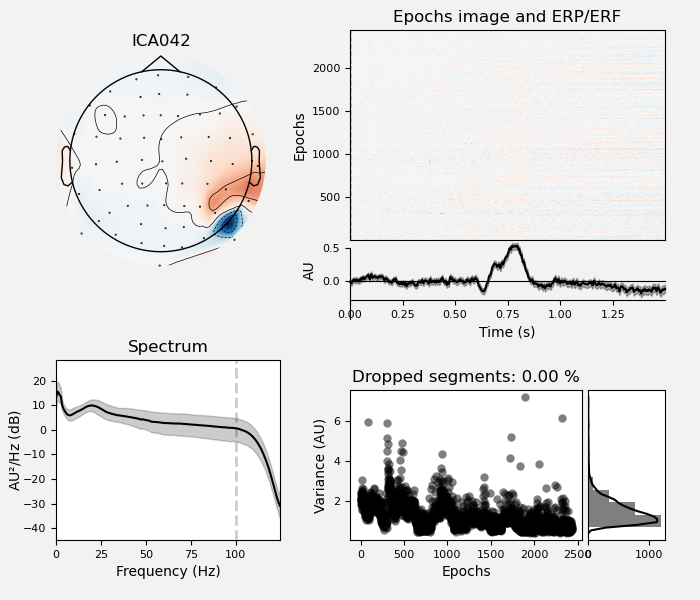

2435 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


/home/gweindel/anaconda3/envs/mne/lib/python3.8/site-packages/mne/viz/ica.py:115: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize, facecolor=[0.95] * 3)


<IPython.core.display.Javascript object>


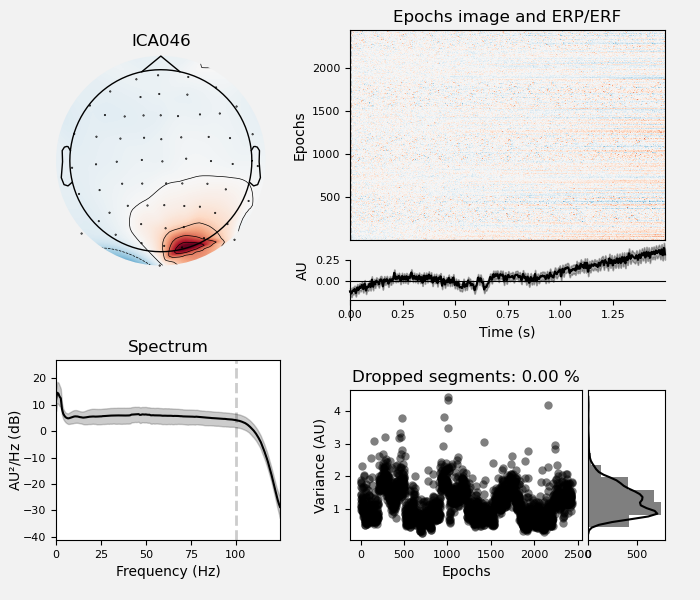

2435 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


/home/gweindel/anaconda3/envs/mne/lib/python3.8/site-packages/mne/viz/ica.py:115: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize, facecolor=[0.95] * 3)


<IPython.core.display.Javascript object>


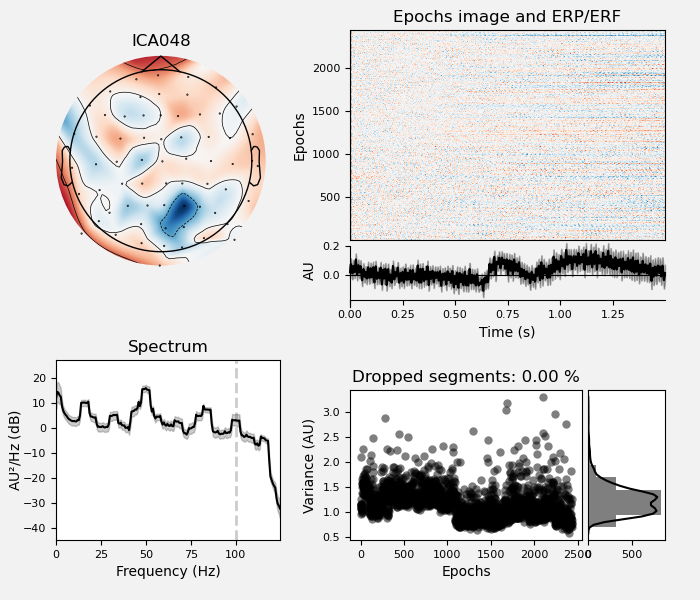

2435 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


/home/gweindel/anaconda3/envs/mne/lib/python3.8/site-packages/mne/viz/ica.py:115: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize, facecolor=[0.95] * 3)


<IPython.core.display.Javascript object>


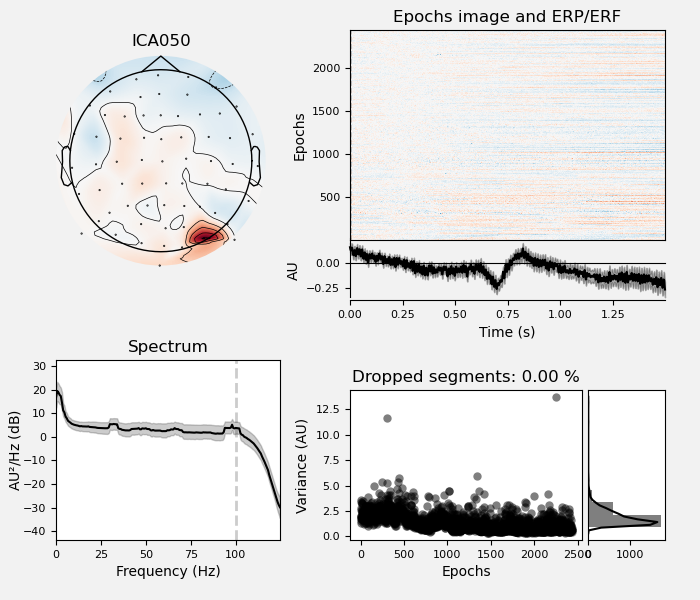

2435 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


In [24]:
ica.plot_properties(epochs_ica, picks=comp_to_inspect);

- ICA 25 : EMG related and seems to occure periodically with experiment time course, could be an artifact only present in high or low force, but close to ROI, KEEP
- 27,29,34,40,46,50 : weak evidence KEEP
- 37,48 is wild, but relatively low variance and some parti in ROI, KEEP
- 28,41,42 stim related activity close to visual ROI, small alpha peak, KEEP

In [25]:
other_comp = []

## Final exclusions of ICA components :

In [26]:
ica.exclude = eog_comp + face_emg_comp + other_emg_comp + other_comp 
print(ica.exclude)

[0, 1, 2, 45, 60, 3, 18, 19, 31, 33, 47, 53, 16, 17, 26]


In [27]:
ica.apply(raw.load_data())


Reading 0 ... 4797439  =      0.000 ...  4684.999 secs...
Transforming to ICA space (63 components)
Zeroing out 15 ICA components


<Raw | pre_rejection_S13.fif, 72 x 4797440 (4685.0 s), ~2.57 GB, data loaded>

## Interpolating the bad electrodes after ICA

In [28]:
raw.info['bads']

[]

In [31]:
#raw = raw.interpolate_bads()

    Automatic origin fit: head of radius 95.3 mm
Computing interpolation matrix from 63 sensor positions
Interpolating 1 sensors


In [29]:
raw.info['bads']

[]

# Saving the final preprocessed data

In [42]:
raw.save("../preprocessed_data/preprocessed_%s.fif"%name_subj,overwrite=True) #sauvegarde les données au format fif pour la suite des traitements

Writing /home/gweindel/ownCloud/PhD/Projets/ForceEEG/processing_EEG/preprocessed_data/preprocessed_S13.fif


<ipython-input-42-02d1e10f2bb7>:1: RuntimeWarning: This filename (/home/gweindel/ownCloud/PhD/Projets/ForceEEG/processing_EEG/preprocessed_data/preprocessed_S13.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz or _meg.fif
  raw.save("../preprocessed_data/preprocessed_%s.fif"%name_subj,overwrite=True) #sauvegarde les données au format fif pour la suite des traitements


Closing /home/gweindel/ownCloud/PhD/Projets/ForceEEG/processing_EEG/preprocessed_data/preprocessed_S13.fif [done]


# Annexe 1: Comparing before/after ICA

Just for illustration puprose I plot the data on the epoch domain befaore and after ICA.

In [7]:
ica.exclude = [0, 1, 2, 45, 60, 3, 18, 19, 31, 33, 47, 53, 16, 17, 26]

epochs_pre_ica = epochs_ica.copy()
ica.apply(epochs_ica)

Transforming to ICA space (63 components)
Zeroing out 15 ICA components


<Epochs  |   2435 events (all good), -0.5 - 0.998 sec, baseline [None, 0], ~1003.8 MB, data loaded,
 'high/accuracy/left/1': 100
 'high/accuracy/left/2': 102
 'high/accuracy/left/3': 100
 'high/accuracy/right/1': 100
 'high/accuracy/right/2': 101
 'high/speed/accuracy/3': 102
 'high/speed/left/1': 102
 'high/speed/left/2': 102
 'high/speed/left/3': 102
 'high/speed/right/1': 102
 'high/speed/right/2': 102
 'high/speed/right/3': 102
 'low/accuracy/left/1': 101
 'low/accuracy/left/2': 101
 'low/accuracy/left/3': 102
 'low/accuracy/right/1': 101
 'low/accuracy/right/2': 102
 'low/speed/accuracy/3': 102
 'low/speed/left/1': 102
 'low/speed/left/2': 102
 'low/speed/left/3': 101
 'low/speed/right/1': 101
 'low/speed/right/2': 101
 'low/speed/right/3': 102>

<IPython.core.display.Javascript object>


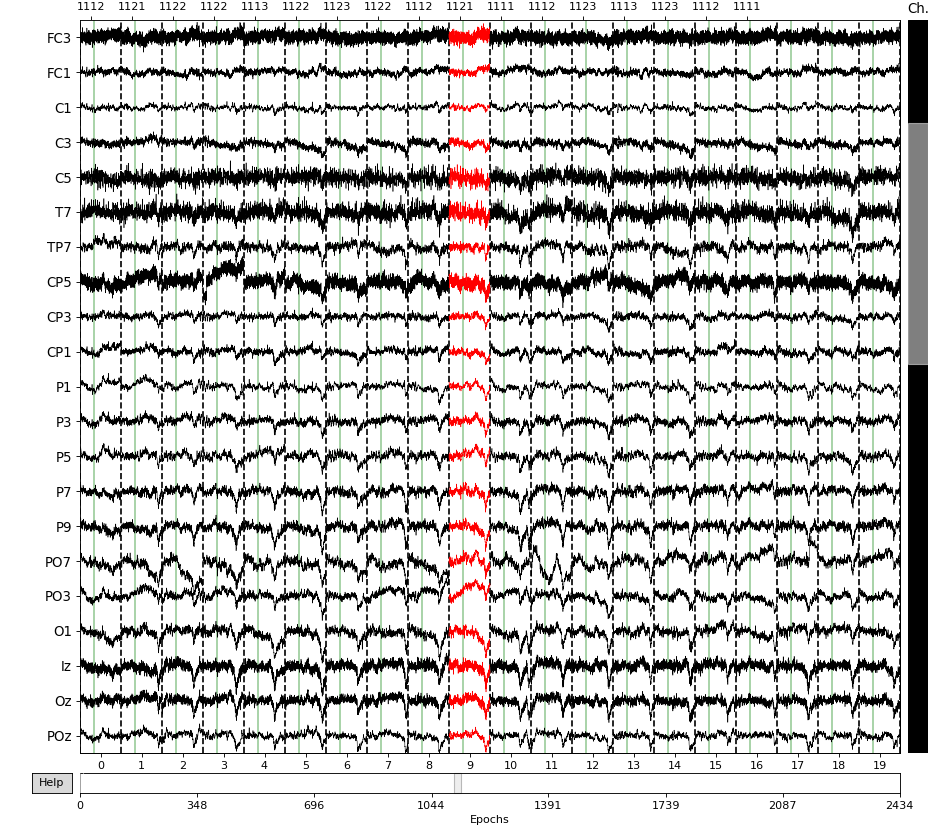

<IPython.core.display.Javascript object>


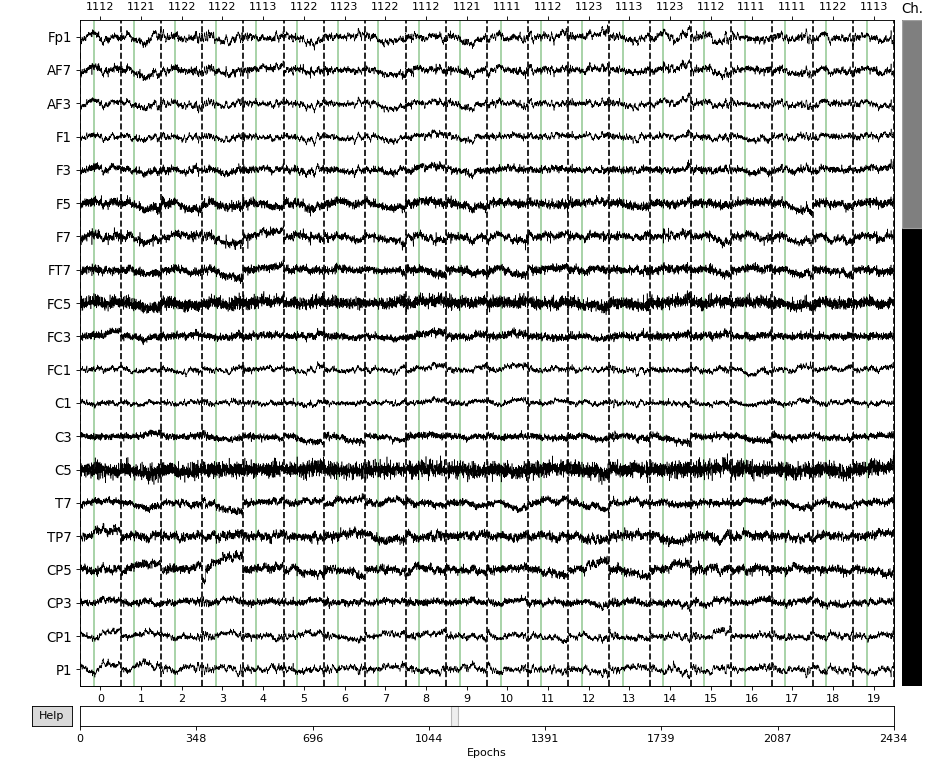

In [8]:
epochs_pre_ica.plot(n_epochs=20,scalings = dict(eeg=60e-6), title="Without ICA");
epochs_ica.plot(n_epochs=20,scalings = dict(eeg=60e-6), title="With ICA");

# Annexe 2: Taking a look at the ERP in monopolar

Again just for illustration purpose I plot the ERP in monopolar (average referenced and low-pass filtered at 30Hz to make pretty plots :-)

In [9]:
epochs_pre_ica.filter(None, 30, None,l_trans_bandwidth='auto',filter_length='auto',phase='zero') 
epochs_ica.filter(None, 30, None,l_trans_bandwidth='auto',filter_length='auto',phase='zero') 
epochs_pre_ica.crop(-0.2,0.6)#redefining epochs to include less pre-setim activity
epochs_ica.crop(-0.2,0.6)#redefining epochs to include less pre-setim activity
epochs_pre_ica.apply_baseline()
epochs_ica.apply_baseline()

Setting up low-pass filter at 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal lowpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 221 samples (0.442 sec)

Setting up low-pass filter at 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal lowpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 221 samples (0.442 sec)

Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


<Epochs  |   2435 events (all good), -0.2 - 0.6 sec, baseline [None, 0], ~536.9 MB, data loaded,
 'high/accuracy/left/1': 100
 'high/accuracy/left/2': 102
 'high/accuracy/left/3': 100
 'high/accuracy/right/1': 100
 'high/accuracy/right/2': 101
 'high/speed/accuracy/3': 102
 'high/speed/left/1': 102
 'high/speed/left/2': 102
 'high/speed/left/3': 102
 'high/speed/right/1': 102
 'high/speed/right/2': 102
 'high/speed/right/3': 102
 'low/accuracy/left/1': 101
 'low/accuracy/left/2': 101
 'low/accuracy/left/3': 102
 'low/accuracy/right/1': 101
 'low/accuracy/right/2': 102
 'low/speed/accuracy/3': 102
 'low/speed/left/1': 102
 'low/speed/left/2': 102
 'low/speed/left/3': 101
 'low/speed/right/1': 101
 'low/speed/right/2': 101
 'low/speed/right/3': 102>

### Visualizing contrast on occipital electrodes

<IPython.core.display.Javascript object>


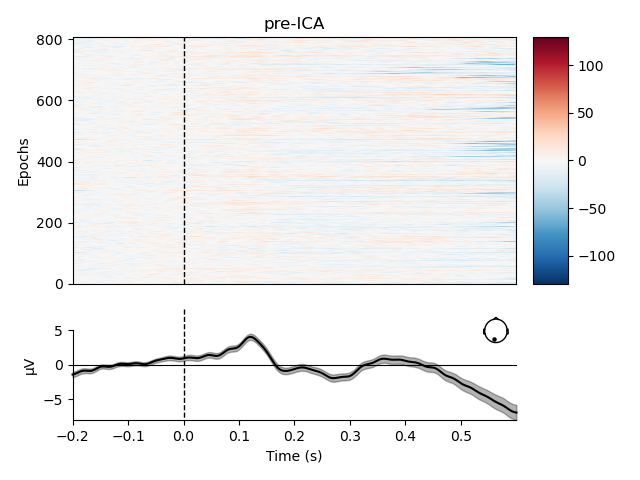

807 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


<IPython.core.display.Javascript object>


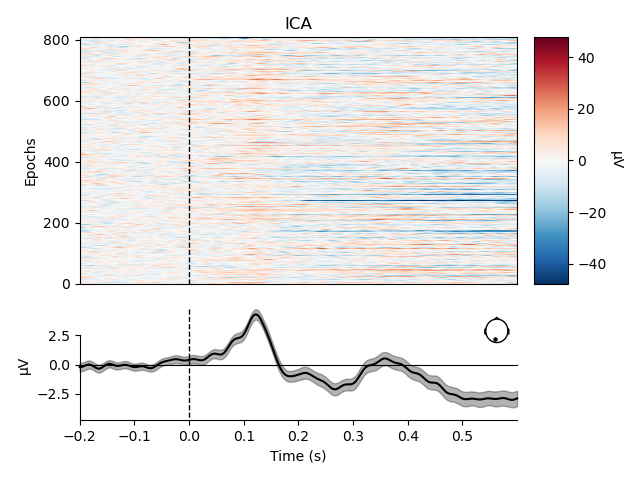

809 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


In [14]:
epochs_pre_ica['1'].plot_image(picks=["O1"], title='pre-ICA');
epochs_ica['1'].plot_image(picks=["O1"], title='ICA');

<IPython.core.display.Javascript object>


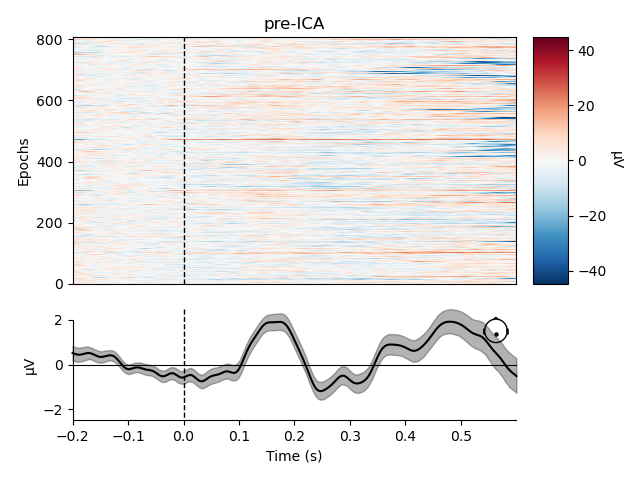

807 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


<IPython.core.display.Javascript object>


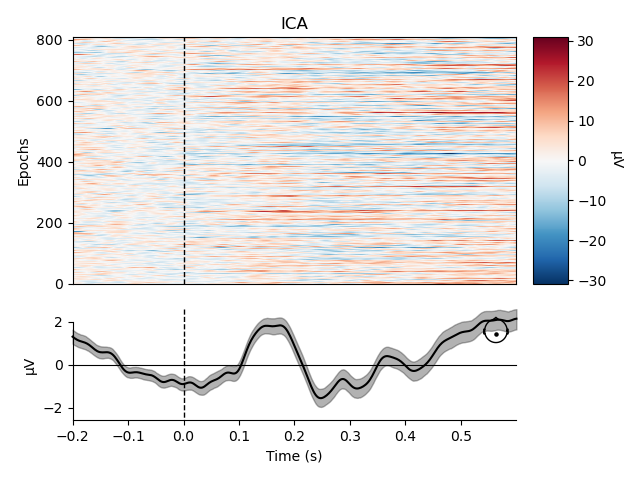

809 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


In [15]:
epochs_pre_ica['1'].plot_image(picks=["Pz"], title='pre-ICA');
epochs_ica['1'].plot_image(picks=["Pz"], title='ICA');

### looking at the difference between lowest and highest contrast across time and electrodes

<IPython.core.display.Javascript object>


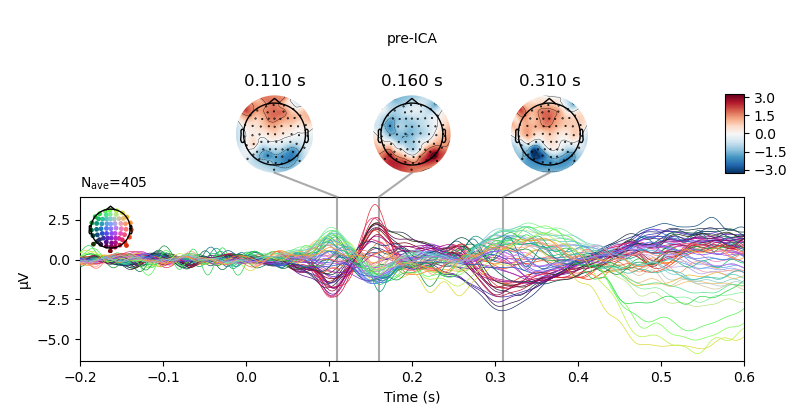

<IPython.core.display.Javascript object>


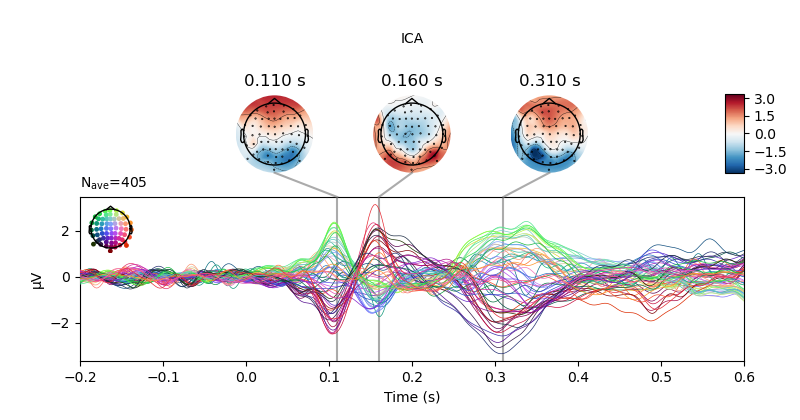

In [12]:
un = epochs_pre_ica["1"].average()
trois = epochs_pre_ica["3"].average()
diff = mne.combine_evoked((un, -trois), weights='equal')
diff.plot_joint(times=[.11,.16,.31], title='pre-ICA');
un = epochs_ica["1"].average()
trois = epochs_ica["3"].average()
diff = mne.combine_evoked((un, -trois), weights='equal')
diff.plot_joint(times=[.11,.16,.31], title='ICA');

### looking at the difference between low and high force across time and electrodes

doesn't make a lot of sense as we should center on EMG/response trigger, the PRe-ICA is obviously highly influenced by blinks

<IPython.core.display.Javascript object>


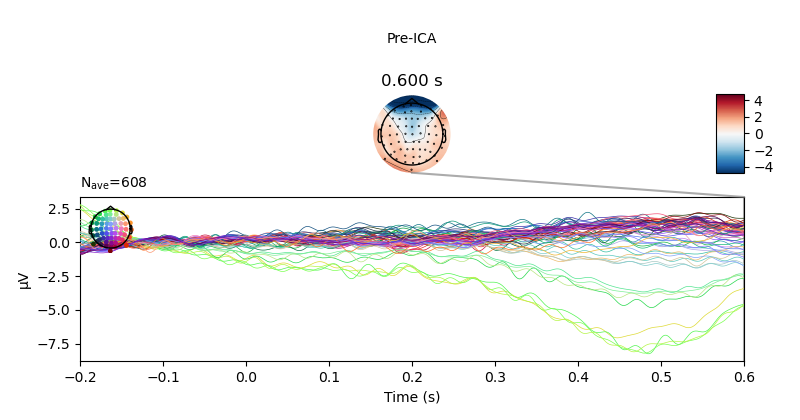

<IPython.core.display.Javascript object>


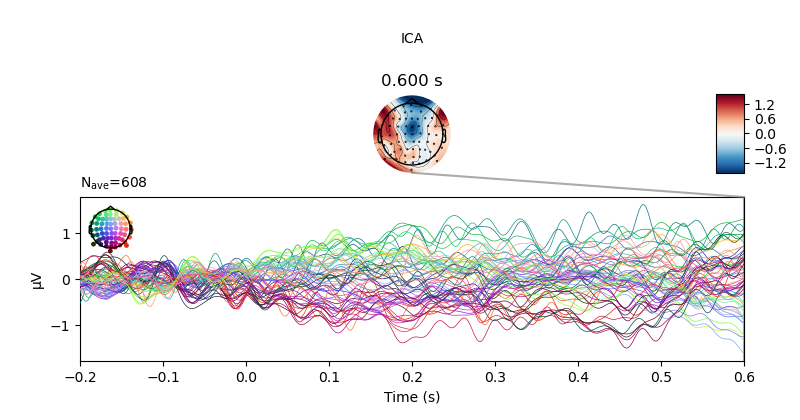

In [13]:
high = epochs_pre_ica["high"].average()
low = epochs_pre_ica["low"].average()
diff = mne.combine_evoked((high, -low), weights='equal')
diff.plot_joint(times=.6, title='Pre-ICA');
high = epochs_ica["high"].average()
low = epochs_ica["low"].average()
diff = mne.combine_evoked((high, -low), weights='equal')
diff.plot_joint(times=.6, title='ICA');